# KymoTracker FANCD2-I diffusion and position analysis

version: 29 February 2024 |  Artur Kaczmarczyk and Korak Ray

David Rueda lab - Single-Molecule Imaging Group at MRC-LMS/Imperial College London

--------------------------------------------------------------------------------

Features of the script:
- Rendering .tiff and .png files from .h5 C-TRAP raw data file
- Kymograph processing: cropping, filtering, compression
- Co-plotting the force measurement
- Position analysis using blue bead center as a reference (improved method in November 2022)
- Single-particle tracking algorithm 
- Mean Square Displacement (MSD) analysis 
- Displacement probability distribution

## Step 1. Import the libraries

In [1]:
from lumicks import pylake                  # main Lumicks package

import matplotlib.pyplot as plt
import numpy as np
import numpy.ma as ma
import sys                                  # needed for automated .h5 loading
import os
import statistics                           # needed for variance calculation in MSD analysis
import peakutils                            # peak finder function
import scipy as scipy  
from scipy import optimize
from scipy.optimize import curve_fit        # for Gaussian fitting 

%matplotlib inline

## Pre-set the visual properties of the rendered plots
plt.rcParams['font.sans-serif'] = "Arial"
plt.rcParams['axes.labelsize'] = 25
plt.rcParams['axes.titlesize'] = 25
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.fontsize'] = 15
plt.rcParams.update({'figure.max_open_warning': 0}) 

# Pre-set custom colormap with RBG saturation for single color graphs, similar to ImageJ convention
from matplotlib.colors import LinearSegmentedColormap
def CustomCmap(from_rgb,to_rgb):

    r1,g1,b1 = from_rgb # from color r,g,b   
    r2,g2,b2 = to_rgb# to color r,g,b
    
    cdict = {'red': ((0, r1, r1),
                   (1, r2, r2)),
           'green': ((0, g1, g1),
                    (1, g2, g2)),
           'blue': ((0, b1, b1),
                   (1, b2, b2))}
    
    cmap = LinearSegmentedColormap('custom_cmap', cdict)
    return cmap

cmap2 = CustomCmap([0.00, 0.00, 0.00], [0.00, 0.00, 1.00]) # from black to blue
cmap1 = CustomCmap([0.00, 0.00, 0.00], [0.00, 1.00, 0.00]) # from black to green
cmap0 = CustomCmap([0.00, 0.00, 0.00], [1.00, 0.00, 0.00]) # from black to red

## Step 2. Load the .h5 with a kymograph 

The .h5 file (both 'kymo' and 'marker' type) should be located in the same folder as the current Jupyter Notebook.


In [2]:
# Import the .h5 filename saved in the current directory 

"""the directory must contain the .h5 file and this Jupyter notebook"""

folder = os.getcwd( )
filenames = os.listdir(folder)  
Filenames = []

for filename in filenames:                      # select .h5 files only
    if filename[-3:] == '.h5':
        Filenames.append(filename)

        
name = str(Filenames[0])                        # if there is more .h5 in the directory, change the index 0 to 1 or more
print("Imported file: " + name)
file = pylake.File(name)
print("The kymograph has the I.D. = " + str(list(file.kymos)))   # if more kymographs is saved in a single .h5 file, there will be more than one ID

# Assign the Kymo I.D. as a variable
kymo_number = (list(file.kymos))   

# Inspect the content of the .h5 file
print(file)

#Save the metadata as a .txt
with open(str(name[:-3])+'.txt', 'w') as f:
        print(file, file=f)

#Save as a new .h5 file without HF data (massively reduces the file's size)
file.save_as(str(name)+"_no_HF.h5", omit_data={"Force HF/*"})

Imported file: 20240105-121018 20240105_lambda_gapped25_D2I_WT_RPA Kymograph 23.h5
The kymograph has the I.D. = ['23']
File root metadata:
- Bluelake version: 2.3.2
- Description: 
- Experiment: 20240105_lambda_gapped25_D2I_WT_RPA
- Export time (ns): 1704456715171210300
- File format version: 2
- GUID: {4D86B9BC-7452-4D1B-A8BF-208BF8E560FD}

Bead diameter:
  Template 1:
  - Data type: [('Timestamp', '<i8'), ('Value', '<f8')]
  - Size: 1674
  Template 2:
  - Data type: [('Timestamp', '<i8'), ('Value', '<f8')]
  - Size: 1674
Confocal diagnostics:
  Excitation Laser Blue:
  - Data type: [('Timestamp', '<i8'), ('Value', '<f8')]
  - Size: 1
  Excitation Laser Green:
  - Data type: [('Timestamp', '<i8'), ('Value', '<f8')]
  - Size: 1
  Excitation Laser Red:
  - Data type: [('Timestamp', '<i8'), ('Value', '<f8')]
  - Size: 1
Diagnostics:
  Microstage position X:
  - Data type: [('Timestamp', '<i8'), ('Value', '<f8')]
  - Size: 20
  Microstage position Y:
  - Data type: [('Timestamp', '<i8'), 

## Step 3. Render the kymograph and the corresponding force

Here, the data is accessed with in-built Pylake's commands (slices). The image is rendered just to see how it looks like, and to check the corresponding force measurement.
Later on, the image is analyzed and processed are accesing the data stored in the image's 3D matrix (RGB)

- If there is more than one kymograph in the .h5 file, select the desired one by changing the "index" parameter ('0' is default for a file with a single kymograph)
- Specify the green/red/blue channel for plotting purposes in line 9 (with numbers 1,2,3, respectively). 
- Plotting different colors together will be possible in subsequent cells
- Correct the brightness of the rendered PNG image (edit the "bright" parameter in line 20)

['23']
Maximal pixel value in the selected channel: 2108.0
Minimal pixel value in the selected channel: 0.0
Matrix dimensions (rows/columns/colors): (639, 1358)


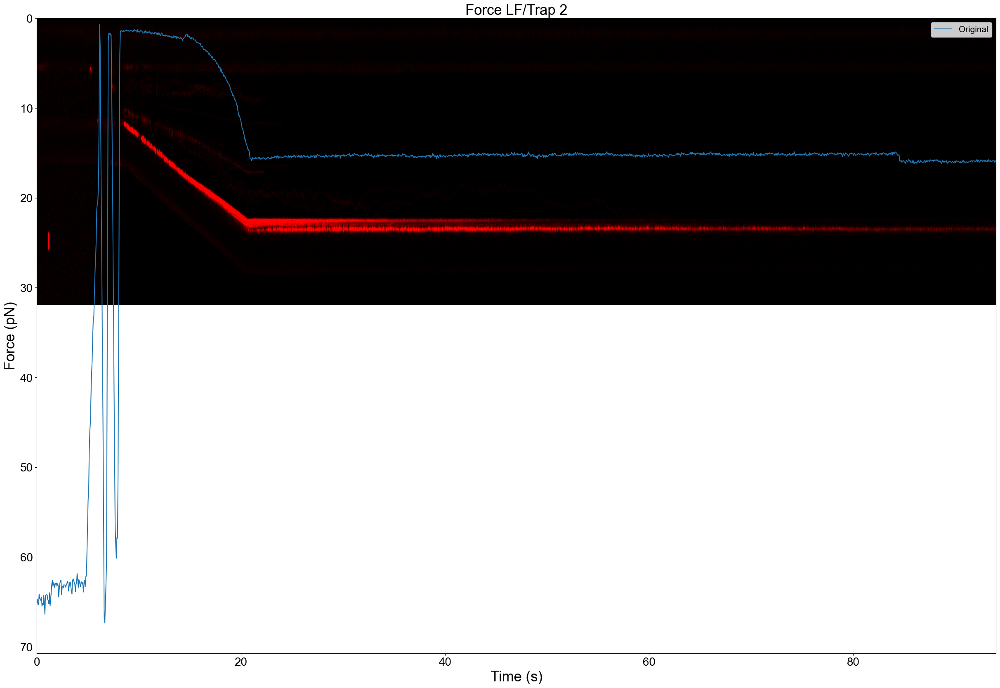

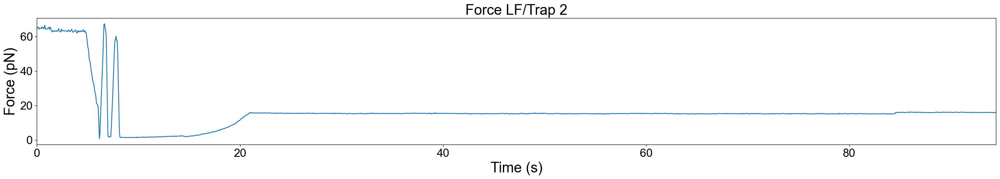

In [4]:
# Call the first kymograph of the imported .h5 file 
index = 0  #change index 0 to 1 or more to call for other kymographs stored in the current .h5 file
kymo = file.kymos[kymo_number[index]]
print(kymo_number)

# Choose the color [channel 1 - green, channel 0 - red, channel 3 - blue, channel 4 for RGB], 
# adjust the brightness, select the force channel and render the kymo 

channel = 1
bright = 0.05
"""If the image is too dimmed, decrease the "bright" parameter"""

string = 'Trap 2'  #alternatively, type: 'Force 1x' to look at the force from the other bead (ideally, they should be the same, except the sign)

ax = plt.figure(figsize=(30,20))

if channel == 1:
    loaded_img = kymo.get_image('red')[:]
    min_px = np.min(loaded_img)
    max_px = np.max(loaded_img)
    kymo.plot('red',vmax=bright*np.max(loaded_img),aspect="auto")
elif channel == 2:
    loaded_img = kymo.green_image[:]
    min_px = np.min(loaded_img)
    max_px = np.max(loaded_img)
    kymo.plot_green(vmax=bright*np.max(loaded_img),aspect="auto")
elif channel == 3:
    loaded_img = kymo.blue_image[:]
    min_px = np.min(loaded_img)
    max_px = np.max(loaded_img)
    kymo.plot_green(vmax=bright*np.max(loaded_img),aspect="auto")
else:
    loaded_img = kymo.rgb_image[:]
    min_px = np.min(loaded_img)
    max_px = np.max(loaded_img)
    kymo.plot_rgb(vmax=bright*np.max(loaded_img),aspect="auto")
    
    
# Get some sense of the image size and pixel values in the kymograph. 

rows = loaded_img.shape[0]
columns = loaded_img.shape[1]
print('Maximal pixel value in the selected channel: ' + str(max_px))
print('Minimal pixel value in the selected channel: ' + str(min_px))
print('Matrix dimensions (rows/columns/colors): ' + str(loaded_img.shape))


## Images will be saved as high-res PNGs with the date and the image's details
plt.savefig('Kymo_'+  (kymo_number[index])+'_' + str(name[0:15])  + '.png', dpi=300, bbox_inches='tight')


timestamps = kymo.timestamps/1e9
kymo_time = (timestamps[0,-1]-timestamps[0,0])  # time in seconds

# Co-plot the (downsampled) force measurement

forcex = file['Force LF'][string]         # force in the x direction (pN)
#forcex = file['Force HF'][string]         # high-frequency force in the x direction (pN)

# If you still keep the high-frequency  [HF] force data, you can downsample it here
#sample_rate = forcex.sample_rate         # downsampling the force, nanostage position and time
#downsampled_rate = 100 # Hz
#forcex_downsamp = forcex.downsampled_by(int(sample_rate/downsampled_rate))


forcex.plot(label="Original")           # raw force data without downsampling 
#forcex_downsamp.plot(color='r',label="force downsampled to 100 Hz")

# Time axis necessary for plotting the force (there's a different acquisition rate for force and for the confocal imaging)
time = forcex.timestamps/1e9             # time traces (seconds)
time = time - time[0]
#time_downsamp = forcex_downsamp.timestamps/1e9
#time_downsamp = time_downsamp - time_downsamp[0]

plt.ylabel('Force (pN)')
plt.xlim([0,int(kymo_time)])
#plt.xticks(np.arange(0, int(kymo_time), 50))
#plt.ylim([0,70])
plt.legend()

plt.savefig('Force1x' + (kymo_number[index]) + '_' + str(name[0:15]) +  '.png', dpi=300, bbox_inches='tight')


#Plot force separately
plt.figure(figsize=(30,4))
forcex.plot(label="Original")
#forcex_downsamp.plot(color='blue')
plt.ylabel('Force (pN)')
plt.xlim([0,max(time)])
#plt.ylim([0,max(forcex_downsamp.data)])
plt.savefig('ForceOnly_' + (kymo_number[index]) + '__' + str(name[0:15]) +  '.png', dpi=300, bbox_inches='tight')
np.savetxt('Force_'+str(name[0:15]) + '_Kymo' + (kymo_number[index]) + '.csv',np.c_[time, forcex.data], delimiter=",") # exports the entire green trace


In [5]:
## Save as .TIFF
kymo.export_tiff('TIFF_Kymo_' + (kymo_number[index]) +'__' + str(name[0:15])+ '.tiff')

## Check confocal laser powers
Time points were the confocal laser power was changed in the Bluelake 
(to do in the future: generate a time-plot indicating laser powers)

The timestamps field is in nanoseconds since epoch, so it has to be converted in order to match the time zero of the experiment

In [6]:
f = pylake.File(name)

# Red color
timestamps1 = f["Confocal diagnostics"]["Excitation Laser Red"].timestamps
data1 = f["Confocal diagnostics"]["Excitation Laser Red"].data
seconds_diagnostics = (timestamps1/1e9 - timestamps[0,0])  # originally in nanoseconds
#print((f["Confocal diagnostics"]["Excitation Laser Red"].timestamps - timestamps[0,0])/1e9)

# Green color
timestamps2 = f["Confocal diagnostics"]["Excitation Laser Green"].timestamps
data2 = f["Confocal diagnostics"]["Excitation Laser Green"].data
seconds_diagnostics2 = (timestamps2/1e9 - timestamps[0,0])  # originally in nanoseconds

# Blue color
timestamps3 = f["Confocal diagnostics"]["Excitation Laser Blue"].timestamps
data3 = f["Confocal diagnostics"]["Excitation Laser Blue"].data
seconds_diagnostics3 = (timestamps3/1e9 - timestamps[0,0])  # originally in nanoseconds

# in case the laser power was changed throughout the image acquisition, there's more numbers in each string
print('RED TIME POINTS AND POWERS')
print(seconds_diagnostics)
print(data1)
print('GREEN TIME POINTS AND POWERS')
print(seconds_diagnostics2)
print(data2) 
print('BLUE TIME POINTS AND POWERS')
print(seconds_diagnostics3)
print(data3) 

print('Red laser power at start = ' +str(data1[0]) + str('%'))
print('Green laser power at start = ' +str(data2[0]) + str('%'))
print('Blue laser power at start = ' +str(data3[0]) + str('%'))


RED TIME POINTS AND POWERS
[-5671.65903997]
[2.00045777]
GREEN TIME POINTS AND POWERS
[-5668.65104008]
[0.99946593]
BLUE TIME POINTS AND POWERS
[-5664.90704012]
[2.00045777]
Red laser power at start = 2.000457770656901%
Green laser power at start = 0.9994659342336155%
Blue laser power at start = 2.000457770656901%


## Image processing functions

To perform single-particle tracking, nothing needs to be really changed in the image, but it is possible to filter the kymographs

In [7]:
## Just load image filters functions here

#  Horizontal Filter
def horizontal_med_filter(rgb_image, size): 
    filt_image = rgb_image[:]
    w = rgb_image.shape[1]  #size of x (pixels?)
    n = 0
    
    for y in range(0,w):
        filt_image[:,y,:] = np.median(rgb_image[:,n:n+size], axis=1) 
        n += 1
    
    return(filt_image)

#   Vertical Filter
def vertical_med_filter(rgb_image, size): 
    filt_image = rgb_image[:]
    h = rgb_image.shape[0]
    n = 0
    
    for y in range(0,h):
        filt_image[y,:,:] = np.median(rgb_image[n:n+size,:], axis=0)
        n += 1
    
    return(filt_image)

#   Sum Horizontal
def sum_horizontal(rgb_image, nlines):
    image_hsum = rgb_image[:]
    w = rgb_image.shape[1]  #size of x (pixels?)
    n = 0
    
    for y in range(0,w):
        image_hsum[:,y,:] = rgb_image[:,n:n+nlines,:].sum(axis=1)
        n += nlines
    
    image_hsum = image_hsum[:,:int(w/nlines),:]
    
    return(image_hsum)

#   Sum Vertical
def sum_vertical(rgb_image, nlines):
    image_vsum = rgb_image[:]
    h = rgb_image.shape[0]
    n = 0
    
    for y in range(0,h):
        image_vsum[y,:,:] = rgb_image[n:n+nlines,:,:].sum(axis=0)
        n += nlines
    
    image_vsum = image_vsum[:int(h/nlines),:,:]
    
    return(image_vsum)


def process_image(rgb_image, level_hfilter, level_vfilter, level_hsum, level_vsum):
    image_hf = horizontal_med_filter(rgb_image, level_hfilter)
    image_hf_vf = vertical_med_filter(image_hf, level_vfilter)
    image_hf_vf_sh = sum_horizontal(image_hf_vf, level_hsum)
    image_hf_vf_sh_vh = sum_vertical(image_hf_vf_sh, level_vsum)
    return(image_hf_vf_sh_vh)

## Step 4. Render the 3-color images

Here, the script creates a 3D matrix *image_rgb* and it will no longer use the Pylake slices commands to access fluorescence data.

Pixel size = 0.05 um/pixel
Line time =  69.42720000000001 milisec
Pixels per line = 639 pixels
Pixel time = 0.1 milisec
Maximal pixel value in the original red channel: 2108.0
Maximal pixel value in the original green channel: 2070.0
Maximal pixel value in the original blue  channel: 94.0
Maximal pixel value in the red channel: 2108.0
Maximal pixel value in the green channel: 2070.0
Maximal pixel value in the blue  channel: 94.0
Data format in the 3D image matrix is: float64
Data format in the 3D image matrix is: float64
Data format in the 3D image matrix is: float64


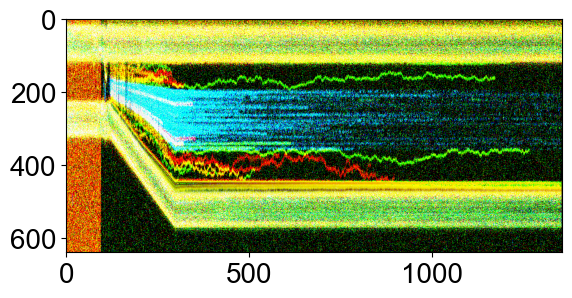

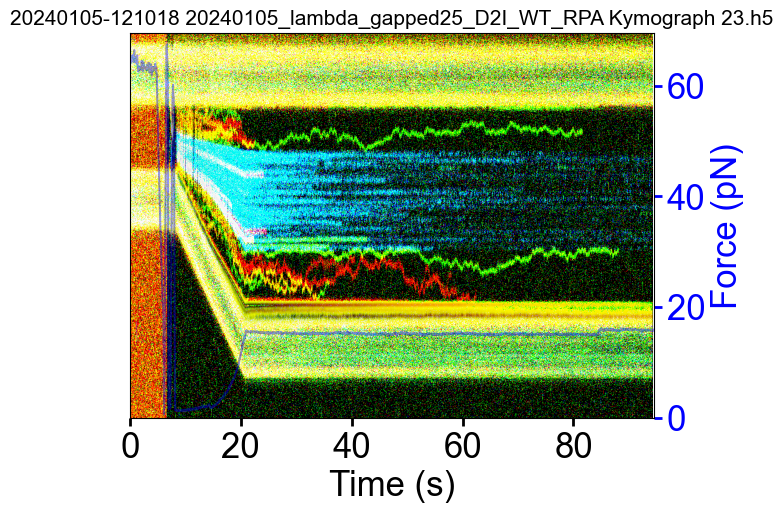

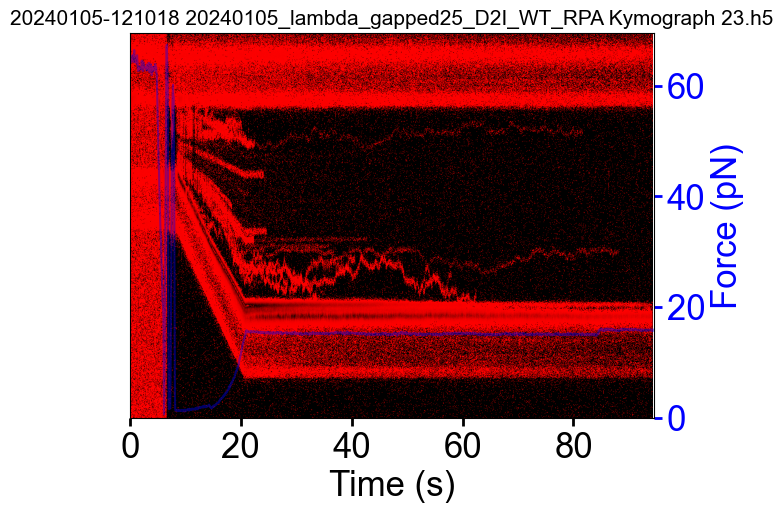

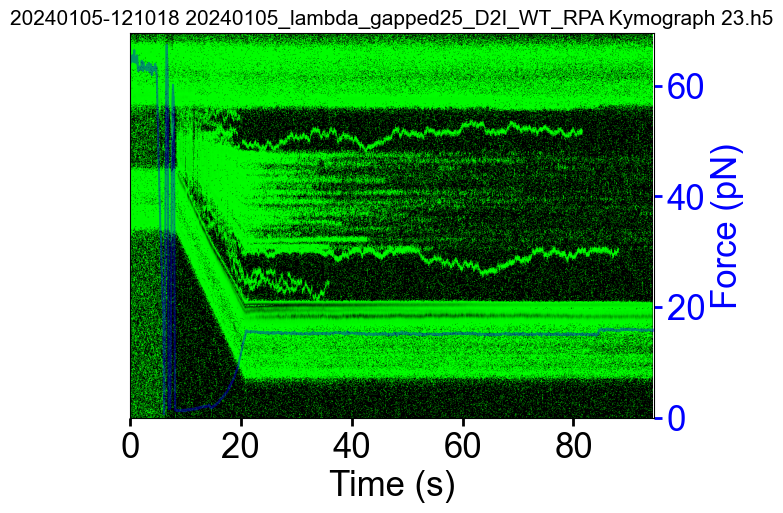

In [8]:
## Load Image as a 3D matrix

kymo = file.kymos[(kymo_number[index])]
image_rgb = []
image_rgb = kymo.get_image('rgb')[:] 

print('Pixel size = ' + str(kymo.pixelsize_um[0]) + ' um/pixel') 
print('Line time =  ' + str(kymo.line_time_seconds*1000) + ' milisec') 
print('Pixels per line = ' + str(kymo.pixels_per_line) + ' pixels') 
pixel_time = kymo.line_time_seconds/kymo.pixels_per_line
print('Pixel time = ' + str(round(pixel_time*1000,1)) + ' milisec') 


## Edit kymo color intensity and image dimensions 

# Define base colour levels (keep 1, better not mess up with pixel values, this remains here but it's not needed anymore)
level_red = 1
level_green = 1
level_blue = 1

# Define Filter and Line Summing (keep 1 for no filtering)
level_hfilter = 1
level_vfilter = 1
level_hsum = 1
level_vsum = 1

# Adjusted colour levels
level_red  /= (level_hsum*level_vsum)
level_green /= (level_hsum*level_vsum)
level_blue /= (level_hsum*level_vsum)

## Adjust colour balance
image_rgb[:,:,0] = image_rgb[:,:,0]*level_red
image_rgb[:,:,1] = image_rgb[:,:,1]*level_green
image_rgb[:,:,2] = image_rgb[:,:,2]*level_blue

processed_image = process_image(image_rgb, level_hfilter, level_vfilter, level_hsum, level_vsum)

# If there is no processing, there should be no change in pixel values
print('Maximal pixel value in the original red channel: ' + str(np.max(image_rgb[:,:,0])))
print('Maximal pixel value in the original green channel: ' + str(np.max(image_rgb[:,:,1])))
print('Maximal pixel value in the original blue  channel: ' + str(np.max(image_rgb[:,:,2])))
print('Maximal pixel value in the red channel: ' + str(np.max(processed_image[:,:,0])))
print('Maximal pixel value in the green channel: ' + str(np.max(processed_image[:,:,1])))
print('Maximal pixel value in the blue  channel: ' + str(np.max(processed_image[:,:,2])))


# Render the processed kymograph 

plt.imshow((processed_image[:,:,:]* 255).astype('uint8'))    # multiplying by 255 and .astype to avoid: "Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
plt.savefig('KymoFrame_'+ (kymo_number[index])+ '__' +str(name[0:15]) + '.png', dpi=300, bbox_inches='tight')


"""Rendering the 3 COLOR kymograph with appropriate time scale"""

line_time_edited = time[-1]/image_rgb.shape[1]
fig, ax = plt.subplots(figsize=(15, 5))
ax.imshow((processed_image[:,:,:]*255).astype('uint8'),extent=[0,kymo_time,0,rows*pixel_time*1000])
ax.tick_params(direction='out', length=6, width=2, labelsize= 25, grid_color='r', grid_alpha=0.5)

#ax.set_ylabel("Position (μm)",  fontsize=25)
#ax.tick_params(direction='out', length=6, width=2, labelsize= 25, grid_color='r', grid_alpha=0.5)

forcex.plot(color='blue', alpha=0.4)
ax.yaxis.tick_right()
ax.tick_params(axis="y", colors="blue")
plt.xlim([0,max(time)])
#plt.ylim([0,max(forcex_downsamp.data)])
ax.set_xlabel("Time (s)")
ax.set_ylabel("Force (pN)",color='blue')
ax.yaxis.set_label_position("right")
ax.set_title(name, fontsize= 15)
#fig, ax = plt.subplots(figsize=(6,6))
#plt.imshow(processed_image, cmap=plt.cm.Reds, interpolation='none', extent=[0,line_time_edited[-1]])
#plt.set_aspect(2) # you may also use am.imshow(..., aspect="auto") to restore the aspect ratio

plt.savefig('KymoTime_' + (kymo_number[index]) + '__' +str(name[0:15]) +  '.png', dpi=300, bbox_inches='tight')
print("Data format in the 3D image matrix is: " + str(image_rgb.dtype))




"""Rendering the RED kymograph with appropriate time scale (cmap = cmap0)"""

line_time_edited = time[-1]/image_rgb.shape[1]
fig, ax = plt.subplots(figsize=(15, 5))
ax.imshow((processed_image[:,:,0]*255).astype('uint8'),cmap = cmap0, extent=[0,kymo_time,0,rows*pixel_time*1000])
ax.tick_params(direction='out', length=6, width=2, labelsize= 25, grid_color='r', grid_alpha=0.5)

#ax.set_ylabel("Position (μm)",  fontsize=25)
#ax.tick_params(direction='out', length=6, width=2, labelsize= 25, grid_color='r', grid_alpha=0.5)

forcex.plot(color='blue', alpha=0.4)
ax.yaxis.tick_right()
ax.tick_params(axis="y", colors="blue")
plt.xlim([0,max(time)])
#plt.ylim([0,max(forcex_downsamp.data)])
ax.set_xlabel("Time (s)")
ax.set_ylabel("Force (pN)",color='blue')
ax.yaxis.set_label_position("right")
ax.set_title(name, fontsize= 15)


#fig, ax = plt.subplots(figsize=(6,6))
#plt.imshow(processed_image, cmap=plt.cm.Reds, interpolation='none', extent=[0,line_time_edited[-1]])
#plt.set_aspect(2) # you may also use am.imshow(..., aspect="auto") to restore the aspect ratio

plt.savefig('KymoTimeRed_' + (kymo_number[index]) + '__' +str(name[0:15]) +  '.png', dpi=300, bbox_inches='tight')
print("Data format in the 3D image matrix is: " + str(image_rgb.dtype))



"""Rendering the GREEN kymograph with appropriate time scale (cmap = cmap1)"""

line_time_edited = time[-1]/image_rgb.shape[1]
fig, ax = plt.subplots(figsize=(15, 5))
ax.imshow((processed_image[:,:,1]*255).astype('uint8'),cmap = cmap1, extent=[0,kymo_time,0,rows*pixel_time*1000])

# for BLUE:
#ax.imshow((processed_image[:,:,2]*255).astype('uint8'),cmap = cmap2, extent=[0,kymo_time,0,rows*pixel_time*1000])

ax.tick_params(direction='out', length=6, width=2, labelsize= 25, grid_color='r', grid_alpha=0.5)

#ax.set_ylabel("Position (μm)",  fontsize=25)
#ax.tick_params(direction='out', length=6, width=2, labelsize= 25, grid_color='r', grid_alpha=0.5)

forcex.plot(color='blue', alpha=0.4)
ax.yaxis.tick_right()
ax.tick_params(axis="y", colors="blue")
plt.xlim([0,max(time)])
#plt.ylim([0,max(forcex_downsamp.data)])
ax.set_xlabel("Time (s)")
ax.set_ylabel("Force (pN)",color='blue')
ax.yaxis.set_label_position("right")
ax.set_title(name, fontsize= 15)
#fig, ax = plt.subplots(figsize=(6,6))
#plt.imshow(processed_image, cmap=plt.cm.Reds, interpolation='none', extent=[0,line_time_edited[-1]])
#plt.set_aspect(2) # you may also use am.imshow(..., aspect="auto") to restore the aspect ratio

plt.savefig('KymoTimeGreen_' + (kymo_number[index]) + '__' +str(name[0:15]) +  '.png', dpi=300, bbox_inches='tight')
print("Data format in the 3D image matrix is: " + str(image_rgb.dtype))

"""SAVING IMAGE PROPERTIES AS .txt """

with open("ImageParameters_"+str(name[:-3])+'.txt', 'w') as f:
        print('Pixel size = ' + str(kymo.pixelsize_um[0]) + ' um/pixel',file=f) 
        print('Line time =  ' + str(kymo.line_time_seconds*1000) + ' milisec',file=f) 
        print('Pixels per line = ' + str(kymo.pixels_per_line) + ' pixels',file=f) 
        print('Pixel time = ' + str(round(pixel_time*1000,1)) + ' milisec',file=f) 
        print('Maximal pixel value in the original red channel: ' + str(np.max(image_rgb[:,:,0])),file=f)
        print('Maximal pixel value in the original green channel: ' + str(np.max(image_rgb[:,:,1])),file=f)
        print('Maximal pixel value in the original blue  channel: ' + str(np.max(image_rgb[:,:,2])),file=f)

## Step 5. Plot cummulative intensity of the kymograph

In [9]:
# Select the start and end point of the kymograph (in seconds)

start = 25
end = 145

# Activate the two lines below if no slicing is required
#start = [0]
#end = int(kymo_time)-1 # subtracting 1 sec in case the rounding approximates to the +1 larger number

if not os.path.exists(str(start)+'_'+str(end)+'s_Window_PositionAnalysis'):
    os.makedirs(str(start)+'_'+str(end)+'s_Window_PositionAnalysis')  # create folder

Line time = 69 ms.


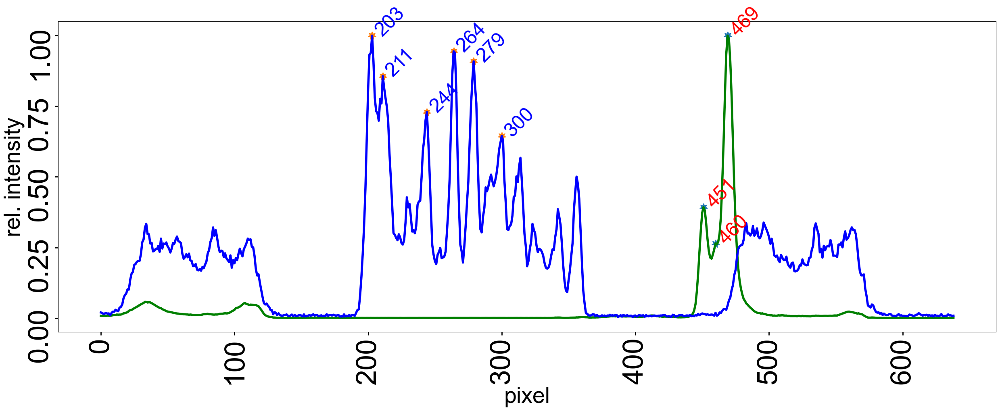

In [10]:
"""Choose the minimal relative intensity that will be considered as peak"""
# DEFINE THE BACKGROUND LEVEL (peaks with relative intensities below this threshold will not be detected)

threshold_data = 0.15
threshold_bead = 0.6


# Check the scanning time per 1 line of the kymograph, translate the time window into pixel domain
line_time = kymo_time/loaded_img.shape[1]
# line_time = time_downsamp[-1]/loaded_img.shape[1]
print('Line time = ' + str(round(line_time*1000)) + ' ms.')
cut_left = int(start/line_time)   # translate the time window into pixel domain
cut_right = int(end/line_time)


# Intensity per line of the color selected in STEP 3
#loaded_img_sum = loaded_img[:,cut_left:cut_right]             # to co-plot the intensity of individual lines
loaded_img_sum = loaded_img[:,cut_left:cut_right].sum(axis=1)  # adding all the selected frames together
#loaded_img_sum = loaded_img[:,:].sum(axis=1)                  # no slicing, co-plot selected window one line by line
norm_loaded_img_sum = loaded_img_sum/np.amax(loaded_img_sum)   # normalization of the intensity


# Intensity of the other channel
beads_img = kymo.get_image('blue')
beads_img_sum = beads_img[:,cut_left:cut_right].sum(axis=1)   
#beads_img_sum = beads_img[:,:].sum(axis=1)                    # no slicing
norm_beads_img_sum = beads_img_sum/np.amax(beads_img_sum)


# Reverse the bead channel (blue) to try extract the bead center (if C-TRAP STED was used)
from scipy.signal import savgol_filter
SavGolwindow = 39
norm_beads_img_sum_EDIT = 1-savgol_filter(norm_beads_img_sum,SavGolwindow, 3)  



# Generate an array with pixel indexes where a peak was found
indexes_bead = []
indexes_bead = peakutils.indexes(norm_beads_img_sum, threshold_bead, min_dist=3)  # peaks with bead centers  
peaks_bead = norm_beads_img_sum[indexes_bead]

indexes_data = []
indexes_data = peakutils.indexes(norm_loaded_img_sum, threshold_data, min_dist=3) # the analyzed signal
peaks_data = norm_loaded_img_sum[indexes_data]

position_pixel =  np.arange(0,rows,1)


fig, ax = plt.subplots(figsize=(30,10))
ax.plot(position_pixel, norm_loaded_img_sum, 'g',position_pixel, norm_beads_img_sum, 'b', linewidth=4.0)
#ax.plot(position, norm_beads_img_sum_cut, 'b', linewidth=8.0)

# Label the peaks
ax.scatter(indexes_data,peaks_data, marker=(7, 1), s=200)
for i, txt in enumerate(indexes_data):
    txt = str(np.round_(indexes_data[i],decimals=1))
    ax.annotate(txt, (indexes_data[i], peaks_data[i]),rotation=45, size=35,color = 'r')

    # Labelling peaks in the other channel
ax.scatter(indexes_bead, peaks_bead, marker=(7, 1), s=200)
for i, txt in enumerate(indexes_bead):
    txt = str(np.round_(indexes_bead[i],decimals=1))
    ax.annotate(txt, (indexes_bead[i], peaks_bead[i]),rotation=45, size=35,color='b')

ax.tick_params(direction='out', length=6, width=2, labelsize= 50, grid_color='r', grid_alpha=0.5)
#ax.legend(['fluophore position ','centers of the beads'], fontsize=50, frameon=False)
ax.set_xlabel("pixel", fontsize=40)
ax.set_ylabel("rel. intensity", fontsize=40)
plt.xticks(rotation=90)
plt.yticks(rotation=90) 


# Save the plot and the peaks data

#os.makedirs(str(start)+'_'+str(end)+'sec_Window_PositionAnalysis')  # create folder
plt.savefig(str(start)+'_'+str(end) +'s_Window_PositionAnalysis'+ '/'+'Pixels_' + str(start) + 's_' + str(end) + 's_Kymo' + (kymo_number[index]) +'__' +str(name[0:15]) +'.png', dpi=300, bbox_inches='tight')
np.savetxt(str(start)+'_'+str(end) +'s_Window_PositionAnalysis'+ '/'+'Pixels_Intensity_' + str(start) + 's_' + str(end) + 's_Kymo' + (kymo_number[index]) + '_' +str(name[0:15])+ '.csv', norm_loaded_img_sum, delimiter=",")    # exports the intensity profile
np.savetxt(str(start)+'_'+str(end) +'s_Window_PositionAnalysis'+ '/'+'Peaks_' + str(start) + 's_' + str(end) + 's_Kymo' + (kymo_number[index]) + '_' +str(name[0:15])+ '.csv', indexes_data, delimiter=",")    # exports the peak position
np.savetxt(str(start)+'_'+str(end) +'s_Window_PositionAnalysis'+ '/'+'Bead_Intensity_' + str(start) + 's_' + str(end) + 's_Kymo' + (kymo_number[index]) + '_' +str(name[0:15])+ '.csv', norm_beads_img_sum, delimiter=",")    # exports the intensity profile
np.savetxt(str(start)+'_'+str(end) +'s_Window_PositionAnalysis'+ '/'+'Bead_Peaks_' + str(start) + 's_' + str(end) + 's_Kymo' + (kymo_number[index]) + '_' +str(name[0:15])+ '.csv', indexes_bead, delimiter=",")    # exports the peak position


## Translation to genomic position
The script recognizes the centers of the bead (blue dot, detected as a blue peak in the cummulative intensity profile). 
Subsequently, it eliminates a few pixels (behind the first bead and upstream the second bead). The eliminated area equals half the bead size (in pixels)

pixel size = 50.0
Average force in the plotted window: 15.32 pN
DNA extension at this force: 16.02 um.
Peaks in the green channel are on positions [41.11477273 42.10681818 43.09886364] kB


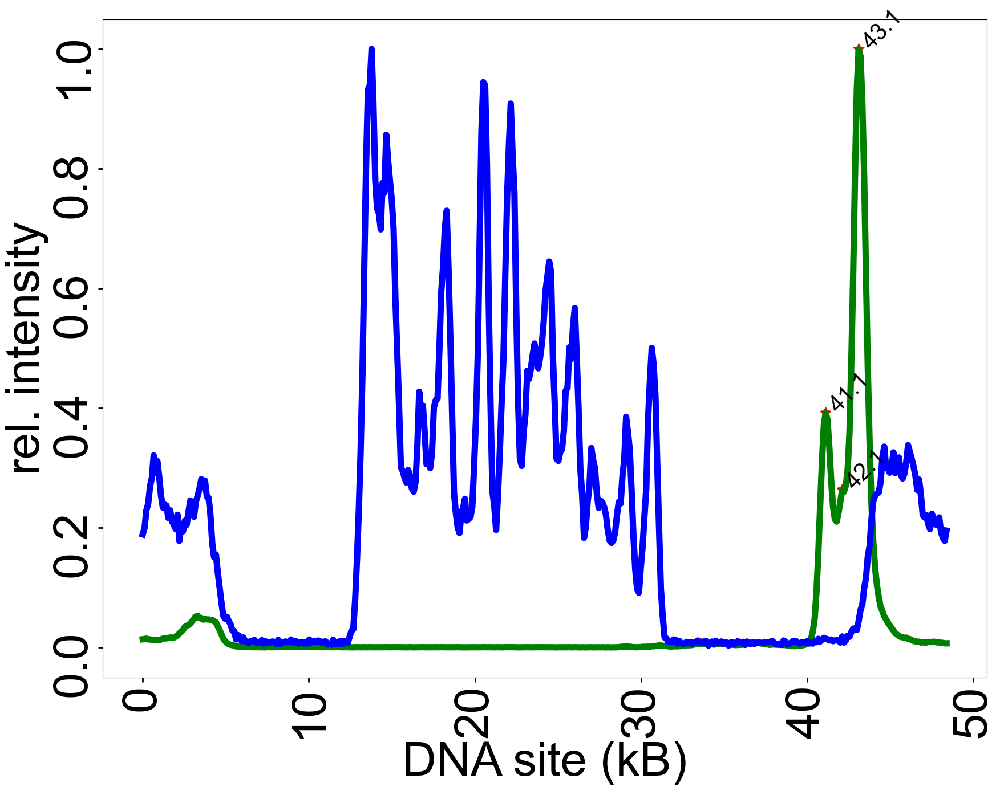

In [11]:
# TYPE THE PARAMETERS CHARTACTERIZING THE EXPERIMENTAL SETUP

# Pixel size (nm/pixel)
ps = kymo.pixelsize_um[0]*1000
print(str('pixel size = ')+str(ps))

# Bead diameter (nm)
bs = 4420 

# length per base pair (nm)
bp = 0.33

# Number of additional kymograph lines next to the bead center peak
offset = 10  

# Tether orientation? Type "1" to reverse it
flip = 0     

# DNA contour length (nm) [ds lambda DNA: 16490 nm]
ds = 16490

# Estimate the effective tether length knowing the force and fitting to the WLC model

#zoom_force = forcex_downsamp[(str(start)+'s'):(str(end)+'s')]  # force exerted on the DNA in the analyzed part of the kymograph
zoom_force = forcex[(str(start)+'s'):(str(end)+'s')]  # force exerted on the DNA in the analyzed part of the kymograph


zoom_force_mean = np.mean(zoom_force.data)
print('Average force in the plotted window: ' + str(np.round(zoom_force_mean,2)) + ' pN')

def eWLC(force, L0):      #Lp is the persistence length in micrometers (0.045 for DNA)
    
    F = force
    Lp = 45        # persistence length (nm)
    kB = 1.38e-2   # Boltzmann constant
    T = 297        # temperature (K)
    S = 1500       #stretching modulus (pN)
    C = kB * T / (Lp)    
    d = L0 - ((L0/2)*np.sqrt(C/F)) + (F*L0/S)

    return(d)


ds_mean = eWLC(zoom_force_mean, ds)   # effective tether length
print('DNA extension at this force: ' + str(np.round(ds_mean/1000,2)) + ' um.')


# DEFINE THE BACKGROUND LEVEL (peaks with relative intensities below this threshold will not be detected)

threshold_data = 0.1
threshold_bead = 0.25


# Generate an array with pixel indexes where a peak was found
indexes_bead = []
indexes_bead = peakutils.indexes(norm_beads_img_sum, threshold_bead, min_dist=3)  # peaks with bead centers  
peaks_bead = norm_beads_img_sum[indexes_bead]

indexes_data = []
indexes_data = peakutils.indexes(norm_loaded_img_sum, threshold_data, min_dist=3) # the analyzed signal
peaks_data = norm_loaded_img_sum[indexes_data]


# Zooming to the region in between two blue peaks 
#roi_left = indexes_bead[0]-offset
roi_left = round(indexes_bead[0]+0.5*bs/ps)
#roi_right = indexes_bead[-1]+offset
roi_right = round(indexes_bead[-1]-0.5*bs/ps)
norm_loaded_img_sum_cut = norm_loaded_img_sum[roi_left:roi_right]
norm_beads_img_sum_cut = norm_beads_img_sum[roi_left:roi_right]


# Linear interpolation of line indexes into length in nanometers and then into DNA bases

xp = [roi_left,roi_right]
#fp = [-0.5*bs-offset*ps, ds_mean+0.5*bs+offset*ps]
#fp = [0, ds_mean]
fp = [0, 48.5]
lines = np.arange(roi_left, roi_right,1)

#position_beads = np.interp(indexes_bead, xp, fp)/bp/1000    # interpolation 
position_beads = np.interp(indexes_bead, xp, fp)
#position_data = np.interp(indexes_data, xp, fp)/bp/1000    # interpolation 
position_data = np.interp(indexes_data, xp, fp)
#position = np.interp(lines, xp, fp)/bp/1000
position = np.interp(lines, xp, fp)

if flip == 1:
    position = position[::-1] 
    position_data  = 48.5-position_data

    

    
fig, ax = plt.subplots(figsize=(20,15))
ax.plot(position, norm_loaded_img_sum_cut, 'g',position, norm_beads_img_sum_cut, 'b', linewidth=8.0)


ax.tick_params(direction='out', length=6, width=2, labelsize= 60, grid_color='r', grid_alpha=0.5)
#ax.legend(['fluophore position ','centers of the beads'], fontsize=50, frameon=False)
ax.set_xlabel("DNA site (kB)", fontsize=60)
ax.set_ylabel("rel. intensity", fontsize=60)
plt.xticks(rotation=90)
plt.yticks(rotation=90) 

# Label the peaks
ax.scatter(position_data,peaks_data, marker=(5, 1), s=200, color ='r')
for i, txt in enumerate(position_data):
    txt = str(np.round_(position_data[i],decimals=1))
    ax.annotate(txt, (position_data[i], peaks_data[i]),rotation=45, size=30)

#ax.scatter(position_beads, peaks_bead, marker=(5, 1), s=200)
#for i, txt in enumerate(position_beads):
  #  txt = str(np.round_(position_beads[i],decimals=1))
  #  ax.annotate(txt, (position_beads[i], peaks_bead[i]),rotation=45, size=30,color='b')





# Remove peaks which are not on the tethered DNA
position_data2 =  position_data[position_data>0]       # eliminating the green peaks coming from the bead1
position_data3 =  position_data2[position_data2<48.5]  # eliminating the green peaks coming from the bead2

#if flip == 1:
    #position_data3 = 48.500 - position_data3
    
print('Peaks in the green channel are on positions ' + str(position_data3) + ' kB' )



plt.savefig(str(start)+'_'+str(end) +'s_Window_PositionAnalysis'+ '/'+'Intensity_' + str(start) + 's_' + str(end) + 's_Kymo' + (kymo_number[index]) + '_' +str(name[0:15])+ '.png', dpi=300, bbox_inches='tight')
np.savetxt(str(start)+'_'+str(end) +'s_Window_PositionAnalysis'+ '/'+'GenomicPosition_Peaks_' + str(start) + 's_' + str(end) + 's_Kymo' + (kymo_number[index]) + '_' +str(name[0:15])+ '.csv', position_data3, delimiter=",")    # exports the peak position
np.savetxt(str(start)+'_'+str(end) +'s_Window_PositionAnalysis'+ '/'+'Intensities_' + str(start) + 's_' + str(end) + 's_Kymo' + (kymo_number[index]) + '_' +str(name[0:15])+ '.csv',np.c_[position, norm_loaded_img_sum_cut], delimiter=",") # exports the entire green trace
np.savetxt(str(start)+'_'+str(end) +'s_Window_PositionAnalysis'+ '/'+'Beads_Peaks_' + str(start) + 's_' + str(end) + 's_Kymo' + (kymo_number[index]) + '_' +str(name[0:15])+ '.csv', position_beads, delimiter=",")    # exports the peak position
np.savetxt(str(start)+'_'+str(end) +'s_Window_PositionAnalysis'+ '/'+'Beads_Intensities_' + str(start) + 's_' + str(end) + 's_Kymo' + (kymo_number[index]) + '_' +str(name[0:15]) +'.csv',np.c_[position, norm_beads_img_sum_cut], delimiter=",") # exports the entire green trace


#plt.savefig(str(name[0:15]) +' SELECTION_' + str(start) + 's_' + str(end) + 's_Kymo' + (kymo_number[index]) + '.png', dpi=300, bbox_inches='tight')

# Single-particle tracking

Locating the position (and movement) of fluoresently labeled molecule on the kymograph.



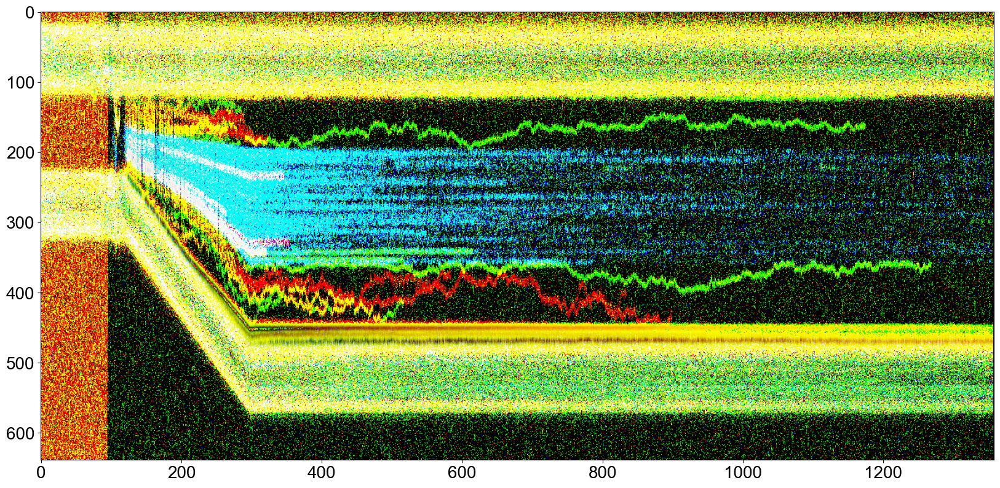

In [12]:
plt.figure(figsize=(20,10))
plt.imshow((processed_image[:,:,:]* 255).astype('uint8')) 


if not os.path.exists('Single-particle tracking'):  
    os.makedirs('Single-particle tracking') 


## Crop the area of interest

The image is called twice. At first, the original, non-processed images is called. Then, the second image is called which can be filtered for single-particle tracking. 
However, if the original has a good quality, there's no need for image filtering, and the two images rendered below will be identical. 
(it's like a back-up option if the image is noisy or if there's a huge background fluorescence).

Control check to make sure what happens with pixel intensities if there is any filtering.
Maximal pixel value in the cropped red channel: 16.0
Maximal pixel value in the cropped green channel: 21.0
Maximal pixel value in the cropped blue  channel: 9.0
Maximal pixel value in the processed and cropped red channel: 16.0
Maximal pixel value in the processed and cropped green channel: 21.0
Maximal pixel value in the processed and cropped blue  channel: 9.0
Line time = 0.06937607539068792s.
Line_time after images summing = 0.06937607539068792s.


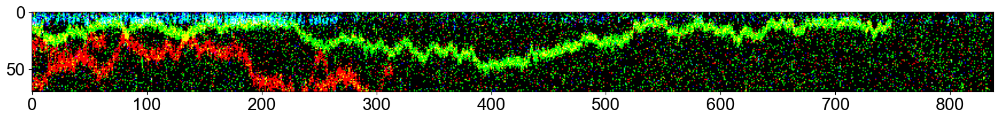

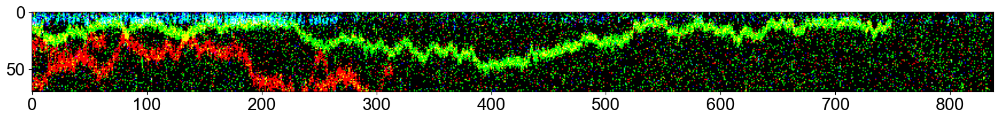

In [19]:
##### Select the image coordinates to crop the image (LOOK AT THE ORIGINAL IMAGE)

crop_top = 350
crop_bottom = 420
crop_left = 520
crop_right = 2000


image_rgb_select = image_rgb[crop_top:crop_bottom,crop_left:crop_right,:]

plt.figure(figsize=(20,10))
plt.imshow((image_rgb_select*255).astype('uint8'))


# Call the raw image again in case something is messed up due to median filterring and squeezing 
index = 0 #change index 0 to 1 or more to call for other kymographs stored in the current .h5 file

# Choose the color [channel 1 - green, channel 2 - red, channel 3 - blue]
channel = 2

if channel == 1:
    loaded_img = kymo.get_image('red')[:]  
elif channel == 2:
    loaded_img = kymo.get_image('green')[:]
else:
    loaded_img = kymo.get_image('blue')[:]
    
#image_rgb = kymo.rgb_image[:]   
#plt.imshow(loaded_img_crop[:,cut_left:cut_right])

plt.savefig('Single-particle tracking' +'/'+'Source_1_RAW_' + 'Kymo' + (kymo_number[index]) +'__' +str(name[0:15]) + '.png', dpi=300, bbox_inches='tight')




"""Call the image one more time"""

index = 0
kymo2 = file.kymos[(kymo_number[index])]
image_rgb2 = kymo2.get_image('rgb')[:] 


# Define base colour levels (keep 1)
level_red = 1
level_green = 1
level_blue = 1

# Define Filter and Line Summing (keep 1 for no filterring)

level_hfilter = 1
level_vfilter = 1
level_hsum = 1
level_vsum = 1

line_time = kymo_time/loaded_img.shape[1]


# Adjusted colour levels
level_red  /= (level_hsum*level_vsum)
level_green /= (level_hsum*level_vsum)
level_blue /= (level_hsum*level_vsum)


## Adjust colour balance
image_rgb2[:,:,0] = image_rgb2[:,:,0]*level_red
image_rgb2[:,:,1] = image_rgb2[:,:,1]*level_green
image_rgb2[:,:,2] = image_rgb2[:,:,2]*level_blue
#line_time_edited = time_downsamp[-1]/image_rgb.shape[1]

processed_image2 = process_image(image_rgb2[crop_top:crop_bottom,crop_left:crop_right,:], level_hfilter, level_vfilter, level_hsum, level_vsum)
#processed_image2 = image_rgb[110:265,10000:,:]

print('Control check to make sure what happens with pixel intensities if there is any filtering.')
print('Maximal pixel value in the cropped red channel: ' + str(np.max(image_rgb_select[:,:,0])))
print('Maximal pixel value in the cropped green channel: ' + str(np.max(image_rgb_select[:,:,1])))
print('Maximal pixel value in the cropped blue  channel: ' + str(np.max(image_rgb_select[:,:,2])))
print('Maximal pixel value in the processed and cropped red channel: ' + str(np.max(processed_image2[:,:,0])))
print('Maximal pixel value in the processed and cropped green channel: ' + str(np.max(processed_image2[:,:,1])))
print('Maximal pixel value in the processed and cropped blue  channel: ' + str(np.max(processed_image2[:,:,2])))


plt.figure(figsize=(20,10))
plt.imshow((processed_image2* 255).astype('uint8'))
#plt.savefig(str(name[0:15]) + '_KymoGraph_Frame_Cut_' + (kymo_number[index]) + '.png', dpi=300, bbox_inches='tight')
plt.savefig('Single-particle tracking' +'/'+'Source_2_' + 'Kymo' + (kymo_number[index]) +'__' +str(name[0:15]) + '.png', dpi=300, bbox_inches='tight')

print('Line time = '+ str(line_time) + 's.')
print('Line_time after images summing = '+ str(line_time*level_hsum) + 's.') # should be the same as above, unless the 2nd kymograph was downsampled

## Single particle tracking algorithm

This function exports trajectories of the fluorescent molecules. By probing each time-frame (averaged by 3-frame moving window), the scripts checks proximity between peaks within the consecutive frames.

Pixels that are not farther than a certain 'step' threshold are considered as elements of a single trajectory ('ridge'). Selected pixels (and a few neighboring pixels from the same time-frame) are then fitted to Gaussian to obtain subpixel resolution of the detection.

The function exports the 2x2D list of the detected ridges and the corresponding time-frames.


Input parameters:
- img_crop_raw - 2D array containing photon counts (single color), unprocessed
- img_crop - 2D array containing photon counts (single color) which could have been filterred (the size must remain the same as the original) 
  <br>NOTE: The tracker works usually well without preceeding image filtering. Effectively, "img_crop" imports the raw image as well. This option remains available though for some difficult kymographs.
  
- thres_peak - threshold for the peak finder function, minimal relative intensity that can be considered as a peak (between 0-1, it works well when thres_peak = 0.1)
- step - the maximal number of pixels that a single molecule can move within 1 time-frame (keep ~10, even more for background free images)
- length - the minimal length of the ridge (allows to remove the shortest found tracks that are potentially artefacts)
- N - number of pixels around the detected peak to be included in Gaussian fitting


In [20]:
## version 1 August 2022

def track_kymo(img_crop_raw, img_crop, color, thres_peak, step, length, N):

    # raw kymograph
    kymo_cut = []
    kymo_cut = img_crop_raw 
    
    
    # image that was optionally median-filterred or downsampled (most likely, it is the same image as original)
    kymo_cut_processed = []
    kymo_cut_processed = img_crop   
                
    [a,b] = kymo_cut.shape

    ridges = [] 
    ridge_found = []
    ridges_found_2D = []
    ridges_found_index_2D = []
    ridges_found_2D_px_value = []

    ###########################
             
    # Function that searches the value in a neighboring array that is the nearest to a defined value
    
    def find_nearest(array, value):             
        array = np.asarray(array)
        idx = (np.abs(array - value)).argmin()
        return idx, array[idx]
    
    # Gaussian function
    
    def _1gaussian(x, amp1,cen1,sigma1):
        return amp1*(np.exp(-0.5*(((x_fit_data_Gauss-cen1)/sigma1)**2)))
        #return amp1*(1/(sigma1*(np.sqrt(2*np.pi))))*(np.exp((-1.0/2.0)*(((x_fit_data-cen1)/sigma1)**2)))
    
    
    ###########################
    
    # Scan each column of the kymograph and search for peaks above the define threshold
    # A moving window of 3 frames is used and the "summed" image is then smoothed with Savitzky-Goliat filter. 
    # Smoothing is used only to detect the peaks. The final signal detection is done on raw pixel counts.
    
    
    from scipy.signal import savgol_filter
    
    pos_smooth = []
    SavGolwindow = 11    ## filter window, USE ODD VALUES
    background = []
    
    for i in range (3,b-10):   #scan every time frame; the last 10 columns of the kymo are ignored
        
           
        kymo_cut_window = []
        kymo_cut_window = kymo_cut_processed[:,i-1:i+2].sum(axis=1)  # moving window of 3 frames
        
        #background = np.mean(kymo_cut_window)
        #kymo_cut_window = kymo_cut_window - background  # subtract background
        
        kymo_cut_smooth = savgol_filter(kymo_cut_window,SavGolwindow, 3) # smooth the summed frame
        
        peaks = peakutils.indexes(kymo_cut_smooth, thres_peak, min_dist=3)  # detect peaks
        #peaks = peakutils.indexes(kymo_cut_processed[:,i], thres_peak, min_dist=2)  # use when you  want to scan each frame individually, without filtering
        
        peaks_list = peaks.tolist()
        ridges.append(peaks_list)
        
        # Now each element of the list contains a sublist of the peaks found in each time-frame 
        
  
    # Render the image of the selected channel, the color scale (cmap) used is the Jupyter's default
    
    fig, ax = plt.subplots(figsize=(28, 4))   
    plt.imshow((kymo_cut*255).astype('uint8')) # multiplying by 255 and .astype to avoid: "Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
    plt.title('Single channel image')
    ax.set_ylabel("Position (px)")


    for i in range(3,b-15):    #  scan every time frame; the last columns of the kymo are ignored
    
        if ridges[i] != []:                       # do something unless there is zero peaks in the current time-frame

            for j in range (0,len(ridges[i])):    # if the current time-frame has N peaks, there is a chance there are N trajectories to detect
                
                ridges_array = []
                ridges_array_index = []
                ridge_found_Gaussian = []
                ridge_found_Gaussian2 = []
                ridge_px_value = []
                ridges_array_px_value = []
                
                
                # Take the very first peak found in the current time-frame. 
                    # This peak will be removed from the "ridges" list afterwards, 
                    # so once the loop makes another round, the next peak will become the new first in the updated list 
                
                ridge_found = ridges[i][0]
                
                
                # Fit Gaussian by analyzing pixel values of N neighboring pixels in the current frame  
                # The fitting happens on the raw, unprocessed image (single frame) or on a moving window composed of 3 summed frames
                
                
                x_fit_data_Gauss = [] 
                fit_data_Gauss = []
                range1 = ridge_found-N
                range2 = ridge_found+N
                
                x_fit_data_Gauss = np.arange(2*N)+ridge_found-N
                
                # Fit Gaussian from a single frame
                #fit_data_Gauss = kymo_cut[range1:range2,i]
                
                # Fit Gaussian from 3 summed frames and subtract background (OPTIONAL, GOOD FOR DIMMED TRACES with high background)
                #fit_data_Gauss = kymo_cut[range1:range2,i-1:i+2].sum(axis=1)- np.mean(kymo_cut[range1:range2,i-1:i+2].sum(axis=1))
                fit_data_Gauss = kymo_cut[range1:range2,i-1:i+2].sum(axis=1)
                
                # Fitting happens unless the detected peak is near the edge or unless the fitting function cannot do the job well
                if range1 > round(N/2+1) and range2 < a-(round(N/2+1)):    # fitting won't go when the ridge less than N/2 pixels from the edge [otherwise there's a problem with looking at neighbors from both sides]
                    
                    # The expected amplitude (p0[0]) of the fit is the pixel value of the peak
                    # The expected center (p0[1]) is the pixel position of the peak
                    # The expected sigma (p0[2]) of the fit is set to 5
                    
                    # plt.plot(x_fit_data_Gauss,fit_data_Gauss, color='gray', alpha=0.4)
                    try:
                        window = []
                        window = kymo_cut[ridge_found,i]  # the actual signal
                        popt_gauss, pcov_gauss = scipy.optimize.curve_fit(_1gaussian, x_fit_data_Gauss, fit_data_Gauss, p0=[3*window, ridge_found, 5]) #"3* window" because the 3-frame windows add 3 frames so the expected intensity is tripled
                        
                        if abs(popt_gauss[1] - ridge_found) < N: # accept the Gaussian fit if it's not too far from the initially detected peak
                            ridge_found_Gaussian = popt_gauss[1]
                            ridge_px_value = popt_gauss[1]
                            
                        else:
                            ridge_found_Gaussian = ridge_found  # take the initially detected peak position if the Gaussian fitting fails
                            ridge_px_value = 2*kymo_cut[ridge_found,i]
                            
                    except RuntimeError:
                        ridge_found_Gaussian = ridge_found
                        ridge_px_value = 2*kymo_cut[ridge_found,i]
                    
                    #plt.plot(x_fit_data_Gauss,_1gaussian(x_fit_data_Gauss, *popt_gauss), 'k--')
                
                else:
                    ridge_found_Gaussian = ridge_found     # doesn't do the fitting near the edges (probably that's obsolete and the fitting would work)
                    ridge_px_value = 2*kymo_cut[ridge_found,i]
                
                # The detected point is now considered as a beginning of a trajectory. 
                # It is forming a new list (ridge_array) that will consist of peaks found in the subsequent time-frames.
                # The detected point itself is removed from the initial 'ridges' list so it is not considered again in the future 'for' loops.
                
                
                ridges_array.append(ridge_found_Gaussian) 
                ridges_array_index.append(i)
                ridges[i].pop(0)                  # remove the ridge in the current time-frame
                ridges_array_px_value.append(ridge_px_value)
                
                if ridges[i+1] != []:             # proceed with the loop unless the next frame has no peaks

                    # Find the closest peak in the subsequent time-frame
                    
                    ridge_next = find_nearest(ridges[i+1],ridge_found_Gaussian)   #returned [0] is the index, [1] is the intensity
     
                    index1 = ridge_next[0]        
                
                    ridges[i+1].pop(index1)       # remove the ridge so it won't be considered in future loops
                
                    k = 1
                
                    # From now on, a while loop will be probing subsequent time-frames.
                    # The loop goes as long as the neighboring time-frame has a peak in close proximity (threshold defined in the function's input parameter 'step')
                    while  abs(ridge_found_Gaussian-ridge_next[1]) < step and ridges[i+k] != [] and (i+k) < (b-15):
                            
                            ridge_found_Gaussian = ridge_next[1]
                            
                            ## Gaussian fitting as it was done before
                           
                            x_fit_data_Gauss = [] 
                            fit_data_Gauss = []
                            range1 = ridge_next[1]-N
                            range2 = ridge_next[1]+N
                            
                            x_fit_data_Gauss = np.arange(2*N)+ridge_next[1]-N
                            #x2 = np.linspace(ridge_next[1]-N,ridge_next[1]+N,200)
                            
                            # Fit Gaussian from a single frame
                            #fit_data_Gauss = kymo_cut[range1:range2,i+k]
                            
                            # Average 3 frames and subtract background ((OPTIONAL, GOOD FOR DIMMED TRACES with high background))
                            #fit_data_Gauss = kymo_cut[range1:range2,i+k-1:i+k+2].sum(axis=1)-np.mean(kymo_cut[range1:range2,i+k-1:i+k+2].sum(axis=1))
                            fit_data_Gauss = kymo_cut[range1:range2,i+k-1:i+k+2].sum(axis=1)
                            
                            if range1 > round(N/2+1) and range2 < a-(round(N/2+1)):    # excluding the edges

                            
                                
                                #plot to control how does the Gaussian behaves
                                #if k % 100 == 0:  #plot every 100th graph
                                    #fig, ax = plt.subplots(figsize=(5, 4))
                                    #plt.plot(x_fit_data_Gauss,fit_data_Gauss, color='gray', alpha=0.8)
                                    #plt.plot(kymo_cut[:,i+k],color='gainsboro', alpha=0.2)
                                    
                                    #plt.xlim([15,50])
                                    #plt.ylabel("intensity")
                                    #plt.xlabel("pixel")
                                    
                                try:
                                    window = []
                                    window = kymo_cut[ridge_next[1],i+k]  #the actual signal
                                    popt_gauss, pcov_gauss = scipy.optimize.curve_fit(_1gaussian, x_fit_data_Gauss, fit_data_Gauss, p0=[3*window, ridge_found_Gaussian, 5])  #"3* window" because the 3-frame windows add 3 frames so the expected intensity is tripled
                                    
                                    #ridge_found_Gaussian = popt_gauss[1]
                                    
                                    if abs(popt_gauss[1] - ridge_found_Gaussian) < N:  ## elimante the fit results if it varies from the original detected peak
                                        ridge_found_Gaussian = popt_gauss[1]
                                        ridge_px_value = popt_gauss[0]
                                        #if k % 100 == 0:
                                            #plt.plot(x_fit_data_Gauss,_1gaussian(x_fit_data_Gauss, *popt_gauss), 'g')
                                            #plt.plot(kymo_cut[:,i+k], color='gainsboro', alpha=0.2)
                                            #plt.xlim([0,a])
                                            #plt.title(str(i)+'__'+str(k))
                                            #plt.savefig('Single-particle tracking' +'/'+'Peaks/'+'PEAKS' + '_i_' +str(i)+'_k_'+str(k)+'_Kymo'+ (kymo_number[index]) +'__' +str(name[0:15]) + '.png', dpi=300, bbox_inches='tight')
                                    
                                    else:
                                        ridge_found_Gaussian = ridge_next[1]
                                        ridge_px_value = 2*kymo_cut[ridge_found,i]
                                        
                                        #plt.plot(x_fit_data_Gauss,fit_data_Gauss, color='green', alpha=0.4)
                                        #if k % 100 == 0:
                                            #plt.plot(x_fit_data_Gauss,_1gaussian(x_fit_data_Gauss, *popt_gauss), 'r--')
                                            #plt.plot(kymo_cut[:,i+k], color='gainsboro', alpha=0.2,)
                                            #plt.xlim([0,a])
                                            #plt.title(str(i)+'__'+str(k))
                                            #plt.savefig('Single-particle tracking' +'/'+'Peaks/'+'PEAKS' + '_i_' +str(i)+'_k_'+str(k)+ '_Kymo'+(kymo_number[index]) +'__' +str(name[0:15]) + '.png', dpi=300, bbox_inches='tight')


                                except RuntimeError:
                                    ridge_found_Gaussian = ridge_next[1]
                                    ridge_px_value = 2*kymo_cut[ridge_found,i]
                                    
                                    
                                    #if k % 100 == 0:
                                        #plt.plot(x_fit_data_Gauss,fit_data_Gauss, color='gray', alpha=0.4)
                                        #plt.plot(kymo_cut[:,i+k], color='gainsboro', alpha=0.2)
                                        #plt.xlim([0,a])
                                        #plt.title(str(i)+'__'+str(k))
                                        #plt.savefig('Single-particle tracking' +'/'+'Peaks/'+'PEAKS' + '_i_' +str(i)+'_k_'+str(k)+ '_Kymo'+(kymo_number[index]) +'__' +str(name[0:15]) + '.png', dpi=300, bbox_inches='tight')


                                #plt.plot(x_fit_dataGauss,_1gaussian(x_fit_data_Gauss, *popt_gauss), 'k--')
                            else:
                                ridge_found_Gaussian = ridge_next[1]
                                ridge_px_value = 2*kymo_cut[ridge_found,i]
                                
                                
                                #if k % 100 == 0:
                                    #plt.plot(x_fit_data_Gauss,fit_data_Gauss, color='gray', alpha=0.4)
                                    #plt.xlim([15,50])
                                    #plt.title(str(i)+'__'+str(k))
                                    #plt.savefig('Single-particle tracking' +'/'+'Peaks/'+'PEAKS' + '_i_' +str(i)+'_k_'+str(k)+ '_Kymo'+(kymo_number[index]) +'__' +str(name[0:15]))                               
                                
                                #fig, ax = plt.subplots(figsize=(10, 4))
                                #plt.plot(x_fit_data_Gauss,fit_data_Gauss, color='gray', alpha=0.4)
                            
                                                
                            #ridges_array.append(ridge_next[1])
                            ridges_array.append(ridge_found_Gaussian)
                            ridges_array_index.append(i+k)
                            ridges_array_px_value.append(ridge_px_value)
                            #ridge_found_Gaussian = ridges_array[-1]
                            ridge_next = find_nearest(ridges[i+k],ridges_array[-1])   # I feel like there should be i+k+1 already but it works only as it is ("ridges" are being removed as they are found, therefore the increment +1 might not be necessary here)
                            index1 = ridge_next[0]
                            ridges[i+k].pop(index1)
                            k += 1
                            
                            
                    ridges_array.pop(-1)        #remove the last detected point as it might be a spike when sth is off with the Gaussian fit
                    ridges_array_index.pop(-1)  #remove the last detected point as it might be a spike when sth is off with the Gaussian fit

                    ridges_array_px_value.pop(-1)
                    
                    #fig, ax = plt.subplots(figsize=(28, 4)) 
                    #ax.plot(ridges_array_index,ridges_array,color='y',linewidth=2, alpha=0.9)
                    
                    if len(ridges_array) > length:
                        ridges_found_2D.append(ridges_array[2:-2])   #there are spikes in the first or last fragments of the trajectories
                        ridges_found_index_2D.append(ridges_array_index[2:-2]) #there are spikes in the first or last fragments of the trajectories
                        ridges_found_2D_px_value.append(ridges_array_px_value[2:-2])
                        ridges_array_index = []

           
    fig, ax = plt.subplots(figsize=(28, 4))   
    #plt.imshow((processed_image2*255).astype('uint8')
    
    if color == 0:
        cmap = cmap0
    elif color == 1:
        cmap = cmap1
    else:
        cmap = cmap2
        
           
    #plt.imshow((kymo_cut*255).astype('uint8'),cmap,vmin=100,vmax=150)
    
    
    'Select the relative pixel intensity to visualize the track better and remove the background'
    kymo_cut = kymo_cut/np.amax(kymo_cut)
    kymo_cut = np.clip(kymo_cut, 0, 0.05)
    plt.imshow(kymo_cut,cmap)
    
    plt.title('RESULT')
    
    print('Maximal pixel value in the processed image: ' + str(np.max(kymo_cut)))


    #plt.imshow(image_rgb_select)
    #plt.imshow(processed_image[crop_top:crop_bottom,crop_left:crop_right,:])

    # Generate random colors to draw above the recognized track
    
    for z in range(0, len(ridges_found_2D)):
        import random
        r = random.random()
        b = random.random()
        g = random.random()
        rand_color = (r, g, b)
        ax.plot(ridges_found_index_2D[z],ridges_found_2D[z],color=rand_color,linewidth=1,alpha=0.8)
        ax.text(ridges_found_index_2D[z][int(len(ridges_found_index_2D[z])/2)],ridges_found_2D[z][-1]-10,str(z),color=rand_color,size=20)
        #ax.set_ylim(ax.get_ylim()[::-1])  #reverses the y-axis
        #print(ridges_found_2D[z])
        
    ax.set_xlabel("Frame")
    ax.set_ylabel("Position (px)")
    ax = plt.gca()
    plt.savefig('Single-particle tracking' +'/'+'TrackedGauss_' + '_Kymo' + (kymo_number[index]) +'__'+str(name[0:15]) + '.png', dpi=300, bbox_inches='tight')

    return(ridges_found_index_2D, ridges_found_2D, ridges_found_2D_px_value)





## Create a folder for the tracking results

In [21]:
if not os.path.exists('Single-particle tracking' +'/'+'Peaks'):
    os.makedirs('Single-particle tracking' +'/'+'Peaks') ## generate a folder in which the Gaussian-fitted selected frames will be saved

## Execute the trajectory search

(70, 838)
(70, 838)
Maximal pixel value in the processed image: 0.05


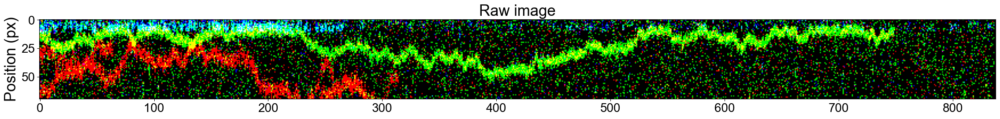

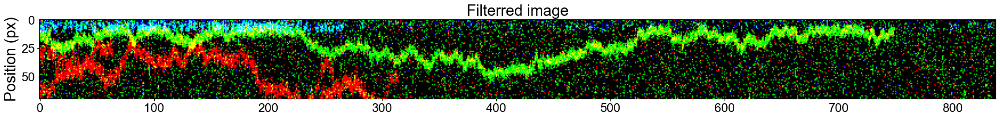

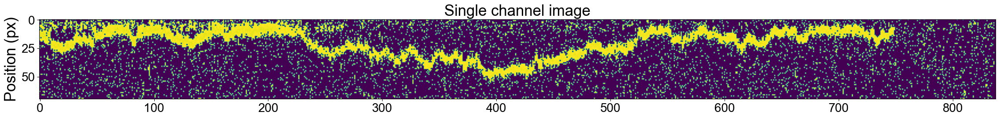

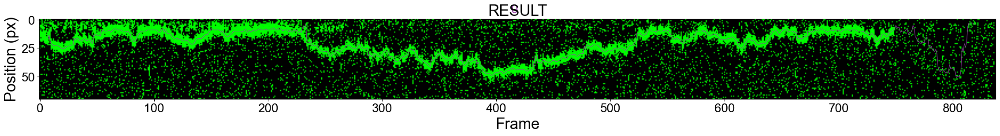

In [22]:
# DEFINE PARAMETERS FOR THE TRACKER

color = 1               ##  0 - red, 1 - green, 2 - blue
thres  = 0.3            ##  minimal relative intensity to be recognized by the peak finder function
jump = 25             ##  how many pixels maximally can a single molecule move within 1 time-frame
length = 200            ##  eliminate short trajectories which are probably noise
Gaussian_window = 7    ##  how many points around the peak should be the fitting done (reduce when there are many sliding molecules near each other)


## Raw image
fig, ax = plt.subplots(figsize=(28, 4))   
plt.imshow((processed_image[crop_top:crop_bottom,crop_left:crop_right,:]*255).astype('uint8'))
plt.title('Raw image')
ax.set_ylabel("Position (px)")

## Processed image, for the peak detection
fig, ax = plt.subplots(figsize=(28, 4))   
plt.imshow((processed_image2*255).astype('uint8'))
plt.title('Filterred image')
ax.set_ylabel("Position (px)")

image_raw = np.int32(image_rgb_select[:,:,color])       ## Raw image, may have only increased intensity for the visual purposes
image_track = np.int32(processed_image2[:,:,color])     ## Processed image, for the peak detection

# Shapes must agree here, keep that in mind in case the image is "squeezed"
print(image_raw.shape)
print(image_track.shape)



#(frames, found_ridges) = track_kymo(image_raw, image_track, color, thres, jump, length, Gaussian_window)

# OPTIONALLY: don't refer to the original image in case you sum neighboring frames (SQUEEZE) as then the image dimensions are different
(frames, found_ridges, pixel_values) = track_kymo(image_track, image_track, color, thres, jump, length, Gaussian_window)

## Analyze each trace individually

### Trace 0 

In [23]:
trace = 0
if not os.path.exists('Single-particle tracking' +'/'+'Trace' + str(trace)):
    os.makedirs('Single-particle tracking' +'/'+'Trace' + str(trace))

0.06937607539068792
Line time = 0.06937607539068792 second per 1 vertical line


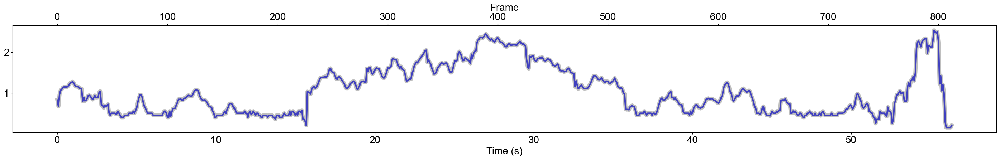

In [24]:
# Select trace

g = []
g = np.array(found_ridges[trace])

## Optionally,  merge a few trajectories together is thery belong to a one molecule
#trace = 0
#g0 = np.array(found_ridges[trace])
#trace = 1
#g1 = np.array(found_ridges[trace])
#g = np.concatenate((g0,g1))
#os.makedirs('Single-particle tracking' +'/'+'Trace' + str(trace))


## Make sure the linetime is not changed in case the kymograph had been downsampled
line_time = kymo_time/loaded_img.shape[1]
print(line_time)
line_time = line_time * level_hsum # important when downsampling the kymograph
print('Line time = '+str(line_time) +' second per 1 vertical line')


#t = np.array(frames[2])
#pos = np.around(g*(ps/1000),decimals =3)   # from pixel to micrometer knowing the pixel size

ps = kymo.pixelsize_um[0]
pos = g*ps


## making use of the interpolation I did earlier 
## I take the genomic position from the point I started the cropping from (keeping in mind the interpolation done earlier was not done in a silly way - it excluded the first few peaks lower that roi_left
## (1 um = 2.941 kb)  [[I HATE THE WAY I DID IT BUT OK... THERE MIGHT BE A SMALL OFFSET]]
# pos_genomic = pos*2.941 + position[crop_top - roi_left] 


# Top of the kymograph includes a half of the bead and 10 additional lines (offset) which needs to be excluded when calculating the genomic position
#start_img = ((10*ps+0.5*bs)/1000)  

# Vector of time (earlier, the code worked on frame numbers)
secs = []
for i in range(0,len(g)):
    secs = np.append(secs,line_time*i)
    

fig, ax1 = plt.subplots(figsize=(28, 4))   # ploting the raw image, 1st derivative image and 2nd derivative image
#ax.plot(secs,(pos-start_img),'b',linewidth =3) 
ax1.plot(secs,(pos),'b',linewidth =3) 

ax2 = ax1.twiny()
ax2.plot(pos,'grey',linewidth =8,alpha=0.5) 
#ax2.plot(secs[chop_front:chop_back],pos_smooth, color='red')
fig.tight_layout()


#plt.gca().invert_yaxis()
#show()
ax.tick_params(direction='out', length=6, width=2, labelsize= 20, grid_color='r', grid_alpha=0.5)
ax.legend(['line time = '+ str(round(line_time*1000,1)) +' ms; pixel size = '+str(ps)+' nm'], fontsize=15)
ax1.set_xlabel("Time (s)", fontsize=20)
ax2.set_xlabel("Frame", fontsize=20)


ax.set_ylabel("Position (μm)", fontsize=20)
#ax2=ax.twinx()
#ax2.plot(secs,pos_genomic,color="blue")
#ax2.set_ylabel("genomic position (kbp)",color="blue",fontsize=14)
#plt.show()
plt.savefig('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' + 'tracked_data_' +'_trace_'+str(trace) + '_Kymo ' + (kymo_number[index]) + '__'+str(name[0:15]) +'.png', dpi=300, bbox_inches='tight')
np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'tracked_data_' + '_trace_'+ str(trace)+'_Kymo '  + (kymo_number[index]) + '__'+  str(name[0:15]) +'.csv', np.c_[secs,pos], delimiter=",")    # exports the peak position
#np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'tracked_data_' + '_trace_'+ str(trace)+'_Kymo '  + (kymo_number[index]) + '__'+  str(name[0:15]) +'.csv', np.c_[secs,pos,pos_genomic], delimiter=",")    # exports the peak position


#np.savetxt(str(name[0:15]) +' tracked_data_' + str(start) + 's_' + str(end) + 's_trace_'+ str(trace)+'s_Kymo '  + (kymo_number[index]) + '.csv', np.c_[secs,pos-start_img], delimiter=",")    # exports the peak position

#plt.savefig(str(name[0:15]) +' tracked_32bit_' + str(start) + 's_' + str(end) + 's_Kymo ' +(kymo_number[index]) + '.png', dpi=300, bbox_inches='tight')



## Plot the trajectory and the corresponding pixel values (2 color channels)

Two options to plot intensities:
1. Fitting Gaussian in each timeframe. Better approach but it ends up with poor fit in blind frames
2. Adding pixel intensities from 4 neighboring points within the detected pixel. For now, I use this option.

0.06937607539068792


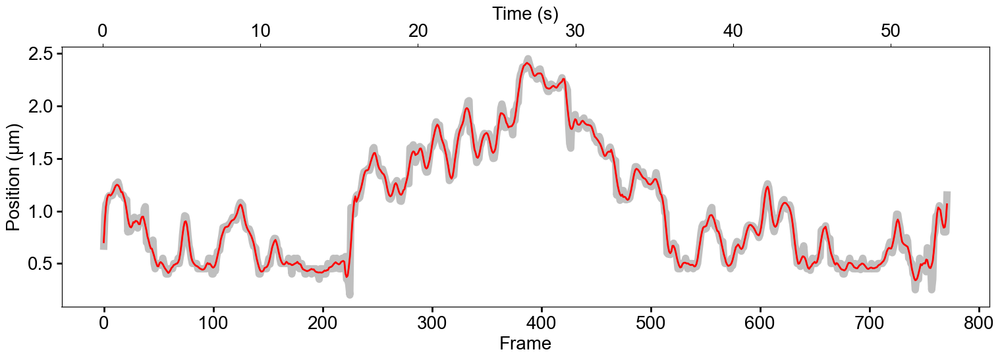

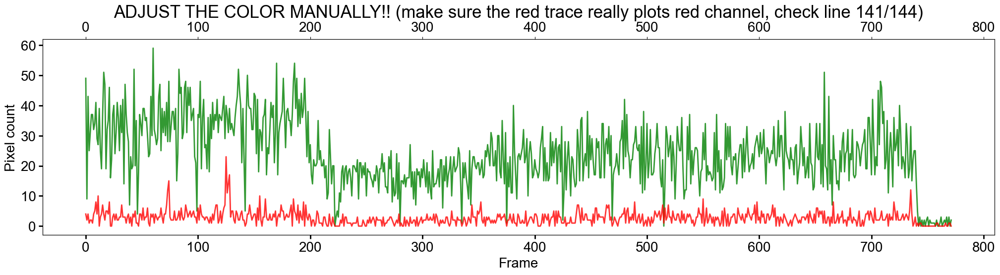

In [25]:
## Look at frames, crop edges if necessary and filter the data 
print(line_time)

"""If you want to plot the wentire trajectory, put 0 and -1, respectively"""
chop_front = 1
chop_back = -40
pos = g[chop_front:chop_back]*(ps)

fig, ax1 = plt.subplots(figsize=(15, 5))   # ploting the raw image
ax1.plot(pos,'grey',linewidth =8,alpha=0.5) 


from scipy.signal import savgol_filter

pos_smooth = []
SavGolwindow = 11
pos_smooth = savgol_filter(pos,SavGolwindow, 3)


ax1.plot(pos_smooth,'r',linewidth =2,alpha=0.8) 
ax1.tick_params(direction='out', length=6, width=2, labelsize= 20, grid_color='r', grid_alpha=0.5)
ax2 = ax1.twiny()
ax2.plot(secs[chop_front:chop_back],pos_smooth, color='red')
fig.tight_layout()

ax.legend(['line time = '+ str(round(line_time*1000,1))+' ms; pixel size = '+str(ps)+' nm','Savitzky-Golay filter window = ' +str(SavGolwindow)], fontsize=15)
ax1.set_xlabel("Frame", fontsize=20)
ax2.set_xlabel("Time (s)", fontsize=20)
ax1.set_ylabel("Position (μm)", fontsize=20)
plt.savefig('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' + 'tracked_data_SGsmooth' +'_trace_'+str(trace) + '_Kymo ' + (kymo_number[index]) + '_'+str(name[0:15]) +'.png', dpi=300, bbox_inches='tight')
np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'tracked_data_SGsmooth' + '_trace_'+ str(trace)+'_Kymo '  + (kymo_number[index]) + '_'+  str(name[0:15]) +'.csv', np.c_[secs[chop_front:chop_back],pos,pos_smooth], delimiter=",")    # exports the peak position



##################

### INTENSITIES FROM THE TRAJECTORY

def _1gaussian(x, amp1,cen1,sigma1):
    return amp1*(np.exp(-0.5*(((x_fit_data_Gauss-cen1)/sigma1)**2)))


# convert lists to arrays
xcor = frames[trace]
xcor_int = np.array([None]*len(xcor))

ycor = np.array(found_ridges[trace])
ycor_int = np.array([None]*len(ycor))

zcor = np.array(pixel_values[trace])
zcor_RAW = []
zcor_RAW_Gauss = []   #fitted Gauss from a single frame rather than from 3 frames as in the trajectory tracker
zcor_RAW_SUM = []     # added neighboring pixels to get intensity
zcor_int = np.array([None]*len(zcor))
zcor_int2 = []      # another color
zcor_int_SUM = []    # added neighboring pixels to get intensity


# convert to integers and find the corresponding intensity from specific pixels(0 - red, 1 - green, 2 - blue)

"""Double check which color you are plotting, default COLOR variable is the tracked trajectory"""
"""Adjust the second color to compare: either COLOR-1 or COLOR+1 to access channel 0,1,2 for Red, Green, Blue respectively"""

# On top of the pixel values from the Gaussian tracker (Gaussian fitted from 3 summed frames), get the raw pixel value from specific pixels

for i in range(len(xcor)):
    
    xcor_int[i] = int(xcor[i])
    ycor_int[i] = int(ycor[i])
    
    zcor_RAW = np.append(zcor_RAW,[processed_image2[ycor_int[i],xcor_int[i],color]],axis=0)
    
    x_fit_data_Gauss = []
    fit_data_Gauss = []
    x_fit_data_Gauss = np.arange(2*3)+ycor_int[i]-3  #look at the +- 3 surrounding pixels within the same frame
    fit_data_Gauss = processed_image2[ycor_int[i]-3:ycor_int[i]+3,xcor_int[i],color] 
     
    # Add the pixel intensity of the few neighboring points
    zcor_RAW_SUM = np.append(zcor_RAW_SUM,[np.sum(fit_data_Gauss)],axis=0) 
    
    # Alternatively, fit every frame with GAUSSIAN to get the peak intensity
    #try:
     #   popt_gauss, pcov_gauss = scipy.optimize.curve_fit(_1gaussian, x_fit_data_Gauss, fit_data_Gauss, p0=[processed_image2[ycor_int[i],xcor_int[i],color], ycor_int[i], 5])  #"3* window" because the 3-frame windows add 3 frames so the expected intensity is tripled
      #  if popt_gauss[0] < np.max(fit_data_Gauss):
       #     zcor_RAW_Gauss = np.append(zcor_RAW_Gauss,[popt_gauss[0]],axis=0)
       # else:
        #    zcor_RAW_Gauss = np.append(zcor_RAW_Gauss,[processed_image2[ycor_int[i],xcor_int[i],color]],axis=0)
            
    #except RuntimeError:
     #   zcor_RAW_Gauss = np.append(zcor_RAW_Gauss,[processed_image2[ycor_int[i],xcor_int[i],color]],axis=0) 
    
    
    
    
    
    # INTENSITY IN ANOTHER CHANNEL (for FRET analysis)        
    #Fit intensity with Gaussia
    x_fit_data_Gauss = []
    fit_data_Gauss = []
    x_fit_data_Gauss = np.arange(2*3)+ycor_int[i]-3  #look at the +- 3 surrounding pixels within the same frame
    
    
    
    """Double check which color you are plotting, default COLOR variable is the tracked trajectory"""
    """Adjust the second color to compare: either COLOR-1 or COLOR+1 to access channel 0,1,2 for Red, Green, Blue respectively"""


    #COLOR2 = color+1
    COLOR2 = color-1
    fit_data_Gauss2 = processed_image2[ycor_int[i]-3:ycor_int[i]+3,xcor_int[i],COLOR2]   
    zcor_int_SUM = np.append(zcor_int_SUM,[np.sum(fit_data_Gauss2)],axis=0) 
    #try:
        #popt_gauss, pcov_gauss = scipy.optimize.curve_fit(_1gaussian, x_fit_data_Gauss, fit_data_Gauss, p0=[processed_image2[ycor_int[i],xcor_int[i],COLOR2], ycor_int[i], 5])  #"3* window" because the 3-frame windows add 3 frames so the expected intensity is tripled
        #if popt_gauss[0] < np.max(fit_data_Gauss):
            #zcor_int2 = np.append(zcor_int2,[popt_gauss[0]],axis=0)
        #else:
            #zcor_int2 = np.append(zcor_int2,[processed_image2[ycor_int[i],xcor_int[i],COLOR2]],axis=0)
            
    #except RuntimeError:
        #zcor_int2 = np.append(zcor_int2,[processed_image2[ycor_int[i],xcor_int[i],COLOR2]],axis=0)                            
    
    #zcor_int2 = np.append(zcor_int2,[processed_image2[ycor_int[i],xcor_int[i],0]],axis=0)

    

fig, ax1 = plt.subplots(figsize=(20, 5))
#plt.plot(xcor_int,zcor_RAW,linewidth = 1, color='red')
SavGolwindow = 101
#zcor_smooth = savgol_filter(zcor_RAW,SavGolwindow, 3)
#plt.plot(xcor_int,zcor_smooth,linewidth = 1, color='red')


ax1.plot(zcor_RAW[chop_front:chop_back],'grey',linewidth =2,alpha=0.0) 
ax1.tick_params(direction='out', length=6, width=2, labelsize= 20, grid_color='r', grid_alpha=0.5)
ax2 = ax1.twiny()

#ax2.plot(zcor_smooth[chop_front:chop_back], color='blue',linewidth=2)
#ax2.plot(zcor_RAW[chop_front:chop_back], color='grey',linewidth=1,alpha=0.5)
#ax2.plot(zcor_RAW_Gauss[chop_front:chop_back], color='red',linewidth=2,alpha=0.8)
ax2.plot(zcor_RAW_SUM[chop_front:chop_back], color='green',linewidth=2,alpha=0.8)
#ax2.plot(zcor_int2[chop_front:chop_back], color='green',linewidth=2,alpha=0.8)

#Second channel
ax2.plot(zcor_int_SUM[chop_front:chop_back], color='red',linewidth=2,alpha=0.8)
fig.tight_layout()
"""ADJUST ABOVE WHICH COLOR YOU NEED TO PLOT IN WHICH TRACE"""

#ax.legend(['line time = '+ str(round(line_time*1000,1))+' ms; pixel size = '+str(ps)+' nm','Savitzky-Golay filter window = ' +str(SavGolwindow)], fontsize=15)
ax1.set_xlabel("Frame", fontsize=20)
ax1.set_ylabel("Pixel count", fontsize=20)
#ax1.set_ylim(-1,np.max(zcor_RAW_SUM)*1.2)
plt.title('ADJUST THE COLOR MANUALLY!! (make sure the red trace really plots red channel, check line 141/144)')


plt.savefig('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' + 'Intensitity' +'_trace_'+str(trace) + '_Kymo ' + (kymo_number[index]) + '_'+str(name[0:15]) +'.png', dpi=300, bbox_inches='tight')
#np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'Intensitiy' + '_trace_'+ str(trace)+'_Kymo '  + (kymo_number[index]) + '_'+  str(name[0:15]) +'.csv', np.c_[xcor_int,zcor,zcor_RAW_SUM,zcor_int_SUM], delimiter=",")    # exports the peak position







## Calculate diffusion coefficient 

1D diffusion coefficient (D) of each molecule is calculated from mean square displacement (MSD), which is given as:

### $ MSD (n,N) = \sum_{i=1}^{N-n} \frac{(Y_{i+n}-Y_{i})^2}{N-n} = 2Dn\Delta t   $ 

where N is the total number of time frames, n is the measurement window ranging from 1 to N-1, Δt is the time interval between frames (line time), and Y is the position of the molecule along DNA

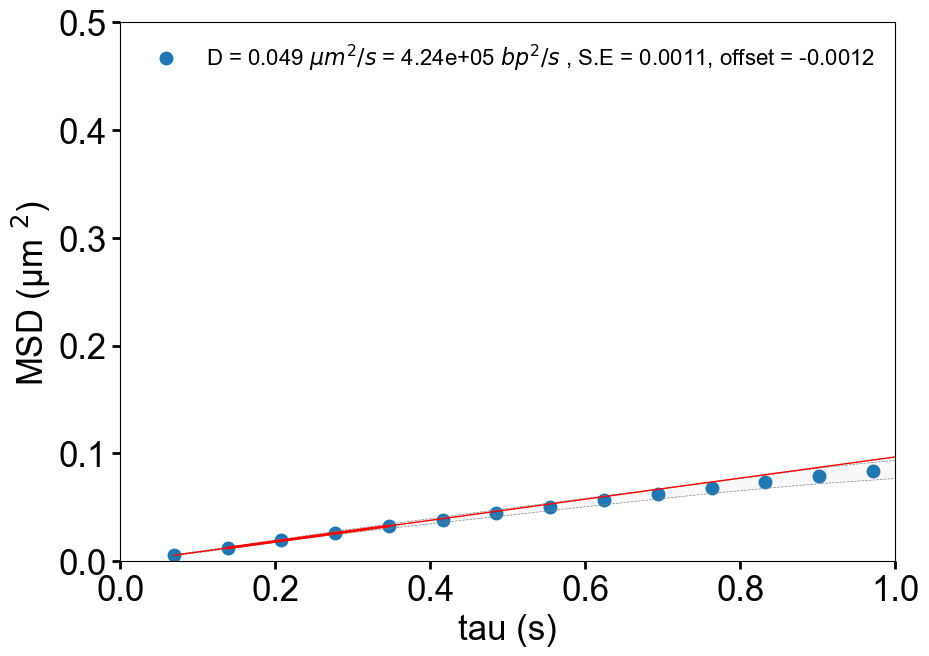

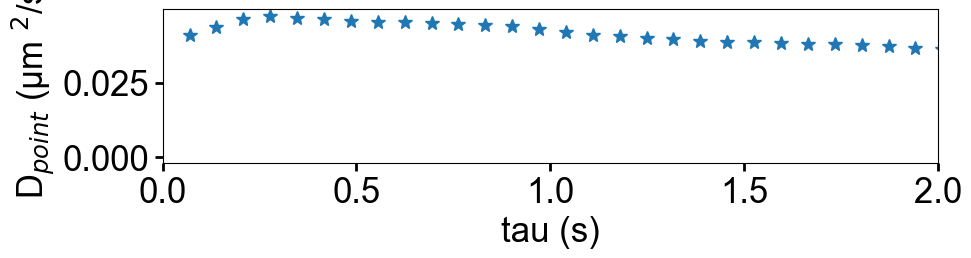

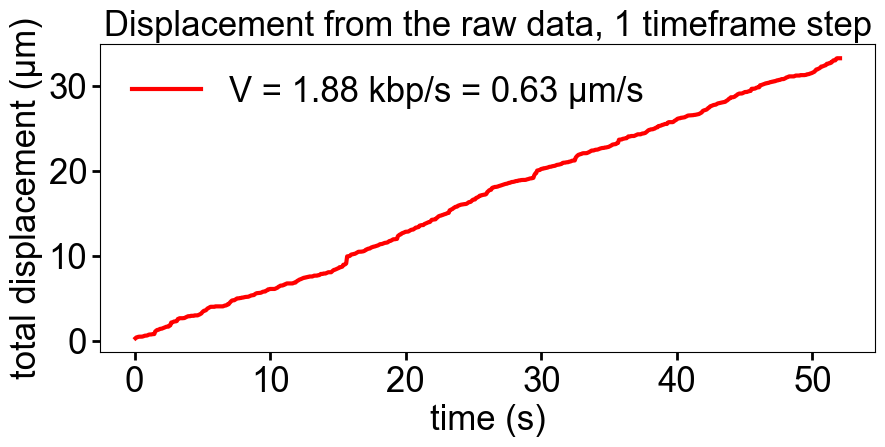

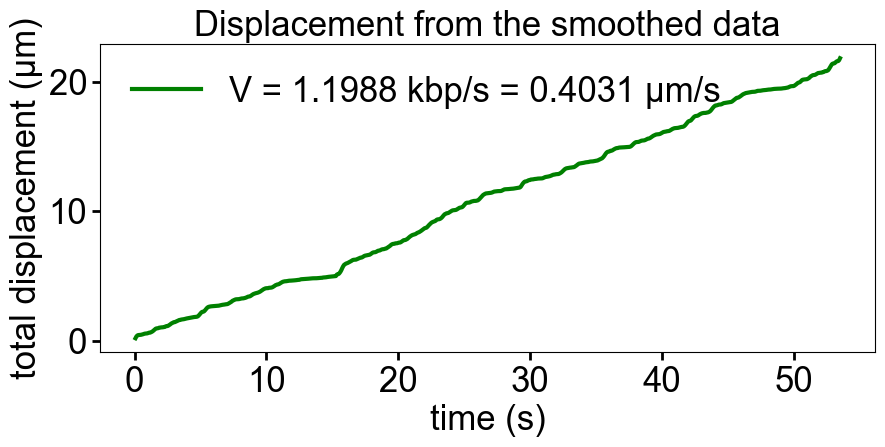

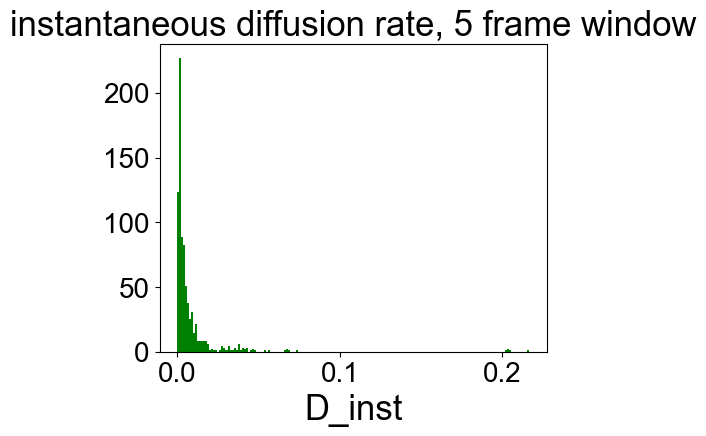

In [27]:
# Set the fitting window

window_min = 1
window_max = 5


## Calculate MSD and speed

N = len(pos)  # number of time frames (kymograph lines)

SqD = []      # vector of square displacement between two datapoints
MSD = []      # vector of mean square displacement for each time window
MSD_local = []
tau = []      # vector of time window (in seconds)
Dpoint = []   # MSD divided at each time window over 2n*dt (just to make a plot of it)
var_array = [] # variance of each MSD
var_up = []
var_down = []



for n in range (1,N-3):        # probing different window sizes starting from n =1 (single linetime - dt) until N-1 (N-3 to be able to calculate variance of the last points)
    
    tau = np.append(tau,[n*line_time],axis=0)
    SqD = []
    
    for i in range (1,N-n):  # for each time window calculate square displacements between i and i+n frame
        
        SqD = np.append(SqD,[(pos[i+n]-pos[i])**2],axis=0)
        
        if n == 5:   #the instantaneous diffusion rate (moving average 5-frame window)
            srednia = ((pos[i+n]-pos[i+n-1])**2+(pos[i+n-1]-pos[i+n-2])**2+(pos[i+n-2]-pos[i+n-3])**2+(pos[i+n-3]-pos[i+n-4])**2+(pos[i+n-4]-pos[i+n-5])**2)/5
            MSD_local = np.append(MSD_local,[srednia/(2*n*line_time)],axis=0)
        
    MSD_point = np.sum(SqD)/(N-n)

    var = statistics.variance(SqD[:])
    
    MSD = np.append(MSD,[np.sum(SqD)/(N-n)],axis=0)   # calculate mean square displacement for each window size
    var_array = np.append(var_array,[var],axis=0)
    var_up = np.append(var_up,[MSD_point+ 0.5*var],axis=0)
    var_down = np.append(var_down,[MSD_point- 0.5*var],axis=0)
    Dpoint = np.append(Dpoint,[(np.sum(SqD)/(N-n))/(2*n*line_time)],axis=0)   # diffusion rate for individual point, later on global G comes from fitting the slope anyways



param,cov = np.polyfit(tau[window_min:window_max], MSD[window_min:window_max], 1,cov=True)
#y = p*tau[window_min:window_max] + q
y = param[0]*tau + param[1]

#Standard error of the linear regression
covMSD = (np.sqrt(np.diag(cov)))

bp_um = (param[0]/2)*(1/0.00034)**2  

# Plot MSD  #plot only 150x linetime, not the whole range (Still the whole range is saved)

fig, ax = plt.subplots(figsize=(10, 7)) 
ax.plot(tau,MSD,'o',markersize='9')
ax.plot(tau[0:150],var_up[0:150],'--',color='grey',linewidth=0.5)
ax.plot(tau[0:150],var_down[0:150],'--',color='grey',linewidth=0.5)
plt.fill_between(tau[0:150], var_down[0:150], var_up[0:150], facecolor="grey", alpha=0.05)
ax.plot(tau,y,'r',linewidth=1)
ax.plot(tau[window_min:window_max],y[window_min:window_max],'r',linewidth=2)
ax.tick_params(direction='out', length=6, width=2, labelsize= 25, grid_color='r', grid_alpha=0.5)
ax.set_xlabel("tau (s)", fontsize=25)
ax.set_ylabel("MSD (\u03BCm $^{2}$)", fontsize=25)
plt.savefig('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'MSDfull_' +'trace_'+ str(trace)+ '_Kymo ' + (kymo_number[index]) + str(name[0:15])+'.png', dpi=300, bbox_inches='tight')

'''CHOOSE AXIS RANGE TO VISUALIZE MSD'''
ax.set_xlim([0, 1])
ax.set_ylim([0, 0.5])

ax.legend(['D = ' + str(np.around(param[0]/2,decimals =3))+' $\u03BCm^2/s$ = ' + "{:0.2e}".format(bp_um) + " $bp^2/s$" + " , S.E = " + str(np.around(covMSD[0]/2,decimals =4)) + ", offset = "+ str(np.around(param[1],decimals=4))],fontsize=16, frameon=False)
plt.savefig('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/'+'MSD_' +'trace'+ str(trace)+ '_Kymo ' + (kymo_number[index])  +str(name[0:15]) +'.png', dpi=300, bbox_inches='tight')

np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'MSD_' +'trace'+str(trace) + '_Kymo' + (kymo_number[index]) +str(name[0:15]) + '.csv', np.c_[tau[window_min:window_max],MSD[window_min:window_max],y[window_min:window_max],var_array[window_min:window_max]], delimiter=",")    # exports the peak position
np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'MSDfull_' +'trace'+str(trace)+'_Kymo' + (kymo_number[index]) +str(name[0:15]) + '.csv', np.c_[tau,MSD,y,var_array], delimiter=",")    # exports the peak position


# Plot D_local (measured at each time window)
fig, ax = plt.subplots(figsize=(10, 2)) 
ax.plot(tau,Dpoint,'*',markersize='10')
ax.tick_params(direction='out', length=6, width=2, labelsize= 25, grid_color='r', grid_alpha=0.5)
ax.set_xlabel("tau (s)", fontsize=25)
ax.set_ylabel("D$_{point}$ (\u03BCm $^{2}$/s)", fontsize=25)
ax.set_xlim([0, 2])
#ax.set_ylim([0, 2*p])



#########  Measure speed (total route divided by time) for raw data (shift between every time frame or manually selected averaging window) and smooth data


# Shifts between frames (MANUALLY AVERAGED POINTS, keep avg_wind = 1 to look at shift without averaging) 

shift_total = []
shift = []
shift_noabs = []
time_avg = []
avg_window = 1  #averaging window size, keep 1 if no averaging

averaged = np.mean(pos[:-1].reshape(-1, avg_window), axis=1)
for i in range(1,int(np.round((N-20)/avg_window))-1):   
    
    averaged = np.mean(pos[:-1].reshape(-1, avg_window), axis=1)
    h = np.abs(averaged[i]-averaged[i-1])

    shift = np.append(shift,[h], axis =0)
    shift_total = np.append(shift_total,[np.sum(shift)],axis=0)

    time_avg = np.append(time_avg,[i*line_time*avg_window])



# Calculate the total route from the smoothed data

time_smooth = [] #it's a normal time but I generate a separate array for the smoothed data
shift_total2 = []
shift2 = []

for i in range(1,N):

    h2 = np.abs(pos_smooth[i]-pos_smooth[i-1])

    shift2 = np.append(shift2,[h2], axis =0)
    shift_total2 = np.append(shift_total2,[np.sum(shift2)],axis=0)
    
    time_smooth = np.append(time_smooth,[i*line_time],axis=0)



velocity = (shift_total[-1]/time_avg[-1])*2941.1764
velocity_smooth = (shift_total2[-1]/(N*line_time))*2941.1764    


    
fig, ax = plt.subplots(figsize=(10,4)) 
ax.plot(time_avg,shift_total, linewidth=3.0, color = 'red')  
ax.tick_params(direction='out', length=6, width=2, labelsize= 25, grid_color='r', grid_alpha=0.5)
ax.set_xlabel("time (s)", fontsize=25)
ax.set_ylabel("total displacement (\u03BCm)", fontsize=25)
ax.set_title("Displacement from the raw data, 1 timeframe step", fontsize=25)
ax.legend(['V = ' + str(np.around(velocity/1000,decimals =2))+' kbp/s = '+ str(np.around(velocity/2974.1764,decimals =2)) + ' \u03BCm/s'], fontsize=25, frameon=False)
plt.savefig('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'Speed_' +'trace_'+ str(trace)+ '_Kymo ' + (kymo_number[index]) + str(name[0:15]) + '.png', dpi=300, bbox_inches='tight')
np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'Speed_' +'trace'+str(trace) + '_Kymo' + (kymo_number[index]) +str(name[0:15]) + '.csv', np.c_[time_avg,shift_total], delimiter=",")    # exports the peak position


fig, ax = plt.subplots(figsize=(10,4)) 
ax.plot(time_smooth,shift_total2, linewidth=3.0, color = 'green')  
ax.tick_params(direction='out', length=6, width=2, labelsize= 25, grid_color='r', grid_alpha=0.5)
ax.set_xlabel("time (s)", fontsize=25)
ax.set_ylabel("total displacement (\u03BCm)", fontsize=25)
ax.set_title("Displacement from the smoothed data", fontsize=25)
ax.legend(['V = ' + str(np.around(velocity_smooth/1000,decimals =4))+' kbp/s = '+ str(np.around(velocity_smooth/2974.1764,decimals =4)) + ' \u03BCm/s'], fontsize=25, frameon=False)
plt.savefig('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'Speed_SGsmooth_' +'trace_'+ str(trace)+ '_Kymo ' + (kymo_number[index]) + str(name[0:15]) + '.png', dpi=300, bbox_inches='tight')
np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'Speed_SGsmooth_' +'trace'+str(trace) + '_Kymo' + (kymo_number[index]) +str(name[0:15]) + '.csv', np.c_[time_smooth,shift_total2], delimiter=",")    # exports the peak position

fig, ax = plt.subplots(figsize=(5,4))
#ax.plot(MSD_local, linewidth=3.0, color = 'green')  

plt.hist(MSD_local, bins = 'auto', density=True,color='g') 
#plt.xlim(0,0.6)
plt.xlabel('D_inst')
plt.title('instantaneous diffusion rate, 5 frame window')
plt.savefig('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'instantaneous_diffusion_rate_' +'trace_'+ str(trace)+ '_Kymo ' + (kymo_number[index]) + str(name[0:15]) + '.png', dpi=300, bbox_inches='tight')
np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'instantaneous_diffusion_rate_' +'trace'+str(trace) + '_Kymo' + (kymo_number[index]) +str(name[0:15]) + '.csv', MSD_local, delimiter=",")    # exports the peak position





## Displacement probability

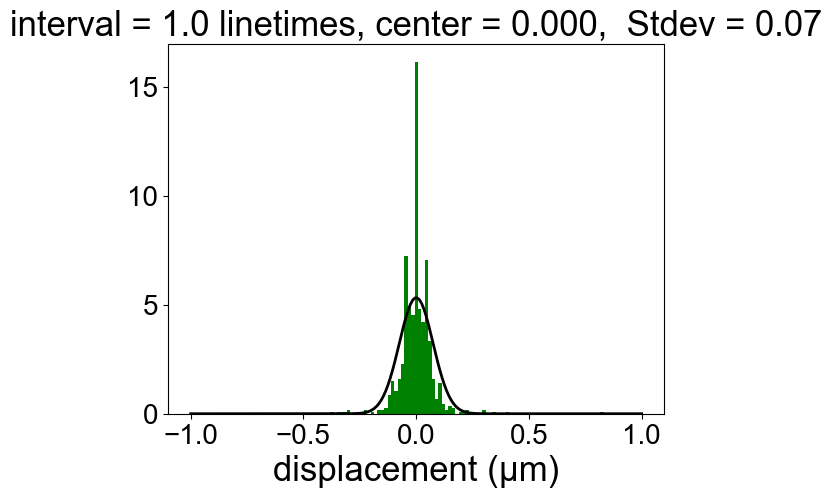

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Gaussian fit results: center = -0.00,  std = 0.17
Exponential fit results: center = 0.00,  var = 0.13


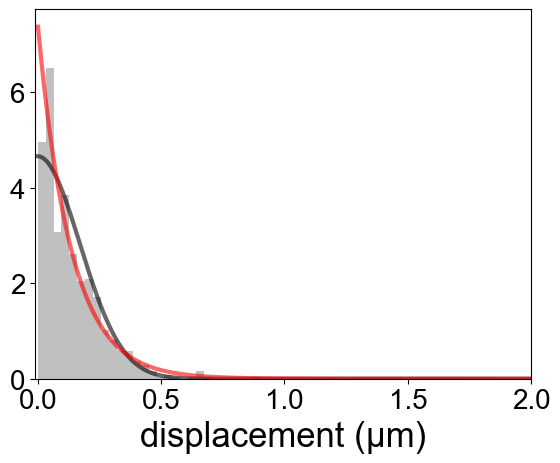

In [28]:
interval = 1    #coparing displacement between 5 time frames
mu = []
std = []
shift_noabs = []


for i in range(1,N-6):                    # looping through each column
     
    shift_noabs = np.append(shift_noabs,[pos[i] - pos[i-1]], axis =0)


plt.hist(shift_noabs,bins='auto', stacked=True, density=True, color='g') 
#plt.xlim([-2,2])

# Fit a normal distribution to the data:
from scipy.stats import norm
mu, std = norm.fit(shift_noabs)


# Plot the PDF.
xmin, xmax = plt.xlim()
x = np.linspace(-1, 1, 200)
prob = norm.pdf(x, mu, std)
plt.plot(x, prob, 'k', linewidth=2)
title = "interval = %.1f linetimes, center = %.3f,  Stdev = %.2f" % (interval,mu, std)
plt.title(title)
plt.xlabel('displacement (\u03BCm)')
plt.savefig('Single-particle tracking' +'/' +'Trace'+ str(trace)+ '/'  +'PDF_' +'trace_'+ str(trace)+ '_Kymo ' + (kymo_number[index]) + str(name[0:15])+ '.png', dpi=300, bbox_inches='tight')
plt.savefig('Single-particle tracking' +'/' +'Trace'+ str(trace)+ '/'  +'PDF_' +'trace_'+ str(trace)+ '_Kymo ' + (kymo_number[index]) + str(name[0:15]) +'.eps', dpi=300, bbox_inches='tight')


np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'PDF_' +'trace'+str(trace)+'_Kymo' + (kymo_number[index]) + str(name[0:15]) +'.csv', np.c_[x,prob], delimiter=",")    # exports the peak position
np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'ShiftNoAbs_' +'trace'+str(trace)+'_Kymo' + (kymo_number[index]) + str(name[0:15]) +'.csv', shift_noabs, delimiter=",")    # exports the peak position

plt.show()


'''One sided distribution, expenential vs. Gaussian fit'''
shift_abs = []

for i in range(1,N-11):                    # looping through each column
     
    shift_abs = np.append(shift_abs,[abs(pos[i+4] - pos[i-1])], axis =0)
    
weights = np.ones_like(shift_abs) / len(shift_abs)
plt.hist(shift_abs,bins='auto',stacked=True, density=True, color='silver') 
plt.xlim([-0.01,2])
#plt.ylim([-0.02,7])

# Fit a normal distribution to the data:
#mu, std = halfnorm.fit(shift_abs)
from scipy.stats import norm
from scipy.stats import halfnorm
from scipy.stats import expon
mu = []
std = []
mu_exp = []
var_exp = []

# Fit a normal distribution to the data:
mu, std = halfnorm.fit(shift_abs)
mu_exp, var_exp = expon.fit(shift_abs)

x = np.linspace(halfnorm.ppf(0.001), halfnorm.ppf(0.999), 1000)
x2 = np.linspace(expon.ppf(0.001),  expon.ppf(0.999), 1000)

prob2 = halfnorm.pdf(x,mu,std)
prob_exp = expon.pdf(x2,mu_exp,var_exp)

plt.plot(x, prob2,'k-', lw=3, alpha=0.6, label='halfnorm pdf')
plt.plot(x2, prob_exp,'r-', lw=3, alpha=0.6, label='expon pdf')

print('Gaussian fit results: center = %.2f,  std = %.2f' % (mu, std))
print('Exponential fit results: center = %.2f,  var = %.2f' % (mu_exp, var_exp))


#title = "Fit results: center = %.2f,  width = %.2f" % (mu, std)
#title = "Gaussian vs. exponential distribution"
#plt.title(title)
#plt.legend('data','Guassian fit','Expenential fit')


plt.xlabel('displacement (\u03BCm)')
plt.savefig('Single-particle tracking' +'/' +'Trace'+ str(trace)+ '/'  +'HalfPDF_' +'trace_'+ str(trace)+ '_Kymo ' + (kymo_number[index]) + str(name[0:15])+ '.png', dpi=300, bbox_inches='tight')
plt.savefig('Single-particle tracking' +'/' +'Trace'+ str(trace)+ '/'  +'HalfPDF_' +'trace_'+ str(trace)+ '_Kymo ' + (kymo_number[index]) + str(name[0:15]) +'.eps', dpi=300, bbox_inches='tight')


np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'PDF_' +'trace'+str(trace)+'_Kymo' + (kymo_number[index]) + str(name[0:15]) +'.csv', np.c_[x,prob2], delimiter=",")    # exports the peak position
np.savetxt('Single-particle tracking' +'/'+'Trace'+ str(trace)+ '/' +'ShiftAbs_' +'trace'+str(trace)+'_Kymo' + (kymo_number[index]) + str(name[0:15]) +'.csv', shift_abs, delimiter=",")    # exports the peak position

plt.show()